In [ ]:
!pip install mne
import mne
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import kurtosis
import scipy
from scipy import stats
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd
import scipy as sp
!pip install mne networkx
import networkx as nx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Reading 0 ... 599999  =      0.000 ...   599.999 secs...


<ipython-input-54-3588a488d537>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.001827  0.000000e+00  0.000896   
1      -0.000113  0.000000e+00  0.001783  1.254835e-07  0.000828   
2       0.000000  0.000000e+00  0.001827  0.000000e+00  0.000898   
3      -0.000113  0.000000e+00  0.001783  1.254835e-07  0.000827   
4       0.000000  0.000000e+00  0.001823  0.000000e+00  0.000894   
...          ...           ...       ...           ...       ...   
599995 -0.001969  6.274174e-08  0.000637  1.882252e-07 -0.000960   
599996  0.000000  0.000000e+00  0.000659  6.274174e-08 -0.001886   
599997 -0.001967  6.274174e-08  0.000636  1.882252e-07 -0.000960   
599998  0.000000  0.000000e+00  0.000662  6.274174e-08 -0.001885   
599999 -0.001965  6.274174e-08  0.000638  1.882252e-07 -0.000959   

                  F4        F8           FT7       FC3           FCZ  \
0       6.274174e-08 -0.000762 -1.317576e-06  0.000364  1.254835e-07   
1       6.274174e-08 -0.001993  1.25483

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.4s finished


Selecting by number: 12 components


<ipython-input-54-3588a488d537>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.1) and smallest (4.1e-12) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


Fitting ICA took 17.3s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


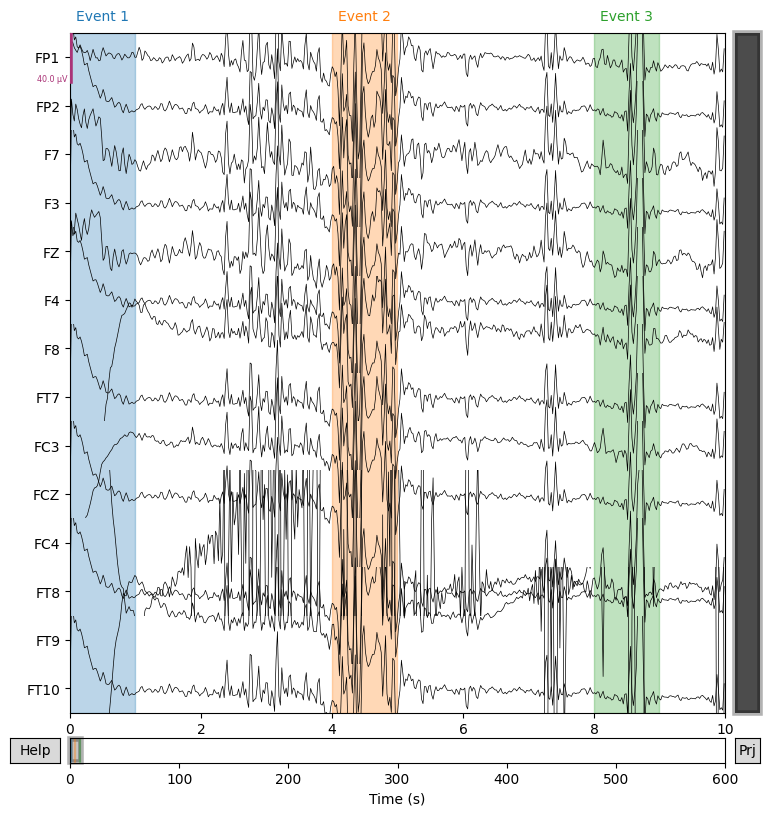

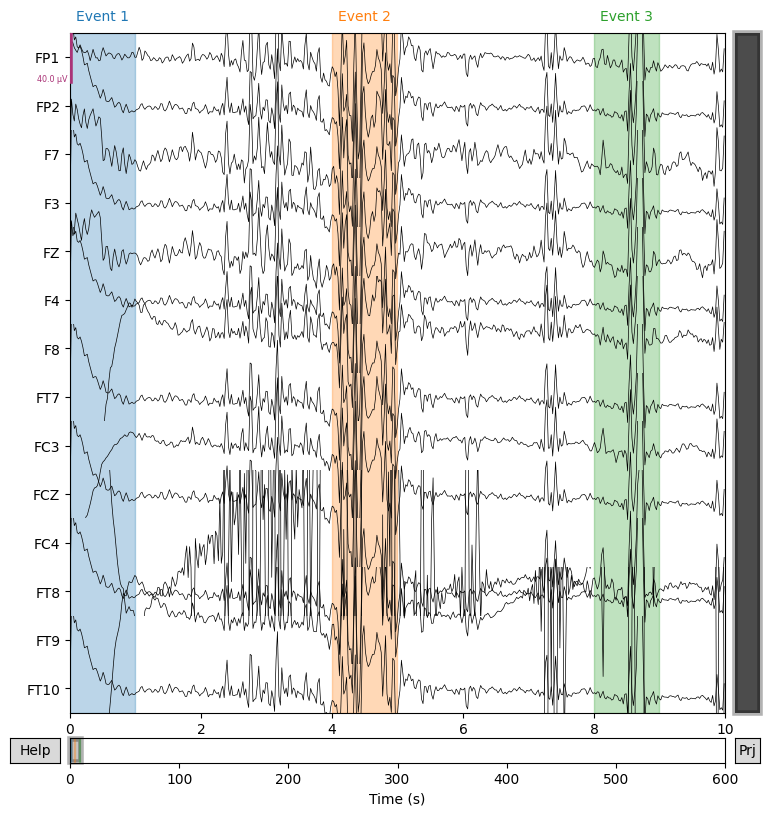

In [ ]:
import os
def handleFile(file_path):
  raw = mne.io.read_raw_cnt(file_path, preload=True)
  f_channels = [ch_name for ch_name in raw.ch_names if ch_name.startswith('F')]
  # Extract the data from the "F" channels
  raw_f = raw.copy().pick_channels(f_channels)
  eeg_data = raw_f.pick_types(eeg=True).get_data()
  df = pd.DataFrame(eeg_data.T, columns=raw_f.ch_names)
  print(df)
  # Preprocess
  raw_f.filter(l_freq=1, h_freq=15)
  # For example, to remove eye blinks using ICA
  ica = mne.preprocessing.ICA(n_components=12, random_state=42)
  ica.fit(raw_f)
  ica.exclude = [0, 1]  # indices of ICs to exclude
  # raw_f = ica.apply(raw_f)


  raw_f.set_eeg_reference(ref_channels='average')
  raw_f.set_eeg_reference(ref_channels='average', projection=True)

  annotations = mne.Annotations(onset=[0, 4, 8], duration=[1, 1, 1], description=['Event 1', 'Event 2', 'Event 3'])
  raw_f.set_annotations(annotations)

  # Extract events from the annotations
  events, event_id = mne.events_from_annotations(raw_f)
  # raw_f.annotations
  # print(event_id)

  # stim_channel = 'HEOL'
  # events = mne.find_events(raw_f,stim_channel=stim_channel)
  # event_id = {'event_name': 1}
  tmin, tmax = -0.2, 0.5
  try:
      # events = mne.find_events(raw_f)
      epochs = mne.Epochs(raw_f, events, event_id, tmin=-0.2, tmax=0.5, baseline=None)
  except ValueError as e:
      print("Error:", e)
  return raw_f
# content = handleFile("/content/drive/MyDrive/cntfiles/Raw Data/1/1/Fatigue state_1.cnt")
content = handleFile("/content/drive/MyDrive/cntfiles/Raw Data/2/2/Normal state.cnt")
content.plot()

In [ ]:
import os
def read_data(file_path):
  raw = mne.io.read_raw_cnt(file_path, preload=True)
  f_channels = [ch_name for ch_name in raw.ch_names if ch_name.startswith('F')]
  # Extract the data from the "F" channels
  raw_f = raw.copy().pick_channels(f_channels)
  eeg_data = raw_f.pick_types(eeg=True).get_data()
  df = pd.DataFrame(eeg_data.T, columns=raw_f.ch_names)
  print(df)
  # Preprocess
  raw_f.filter(l_freq=1, h_freq=20)
  # For example, to remove eye blinks using ICA
  ica = mne.preprocessing.ICA(n_components=12, random_state=42)
  ica.fit(raw_f)
  ica.exclude = [0, 1]  # indices of ICs to exclude
  # raw_f = ica.apply(raw_f)


  raw_f.set_eeg_reference(ref_channels='average')
  raw_f.set_eeg_reference(ref_channels='average', projection=True)

  annotations = mne.Annotations(onset=[0, 4, 8], duration=[1, 1, 1], description=['Event 1', 'Event 2', 'Event 3'])
  raw_f.set_annotations(annotations)

  # Extract events from the annotations
  events, event_id = mne.events_from_annotations(raw_f)
  # raw_f.annotations
  # print(event_id)

  # stim_channel = 'HEOL'
  # events = mne.find_events(raw_f,stim_channel=stim_channel)
  # event_id = {'event_name': 1}
  tmin, tmax = -0.2, 0.5
  try:
      # events = mne.find_events(raw_f)
      epochs = mne.Epochs(raw_f, events, event_id, tmin=-0.2, tmax=0.5, baseline=None)
  except ValueError as e:
      print("Error:", e)
  raw_f.plot()
  return raw_f


In [ ]:
from glob import glob
import os
all_file_path=glob("/content/drive/MyDrive/cntfiles/Raw Data/*/*/*.cnt")
# all_file_path=glob("/content/drive/MyDrive/setfiles/*.set")
print(all_file_path)
print(len(all_file_path))

['/content/drive/MyDrive/cntfiles/Raw Data/6/6/Fatigue state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/6/6/Normal state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/12/12/Normal state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/12/12/Fatigue state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/11/11/Fatigue state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/11/11/Normal state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/4/4/Fatigue state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/4/4/Normal state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/3/3/Fatigue state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/3/3/Normal state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/5/5/Fatigue state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/5/5/Normal state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/2/2/Normal state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/2/2/Fatigue state.cnt', '/content/drive/MyDrive/cntfiles/Raw Data/7/7/Fatigue state.cnt', '/conten

Reading 0 ... 602399  =      0.000 ...   602.399 secs...


/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.001237  6.274174e-08  0.000791   
1      -0.001958  3.137087e-07 -0.000815  6.274174e-08 -0.000746   
2       0.000000  0.000000e+00  0.001234  6.274174e-08  0.000789   
3      -0.001962  3.137087e-07 -0.000818  6.274174e-08 -0.000748   
4       0.000000  0.000000e+00  0.001233  6.274174e-08  0.000790   
...          ...           ...       ...           ...       ...   
602395 -0.001774  3.137087e-07 -0.001500  6.274174e-08 -0.000751   
602396  0.000000  0.000000e+00  0.001434  6.274174e-08  0.000579   
602397 -0.001780  3.137087e-07 -0.001503  6.274174e-08 -0.000753   
602398  0.000000  0.000000e+00  0.001435  6.274174e-08  0.000578   
602399 -0.001785  3.137087e-07 -0.001504  6.274174e-08 -0.000751   

                  F4        F8           FT7       FC3           FCZ  \
0       0.000000e+00 -0.001923 -1.003868e-06  0.001490  2.509669e-07   
1       1.882252e-07  0.001218  1.25483

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.8s finished


Selecting by number: 12 components


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (4) and smallest (2.2e-11) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


Fitting ICA took 23.7s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


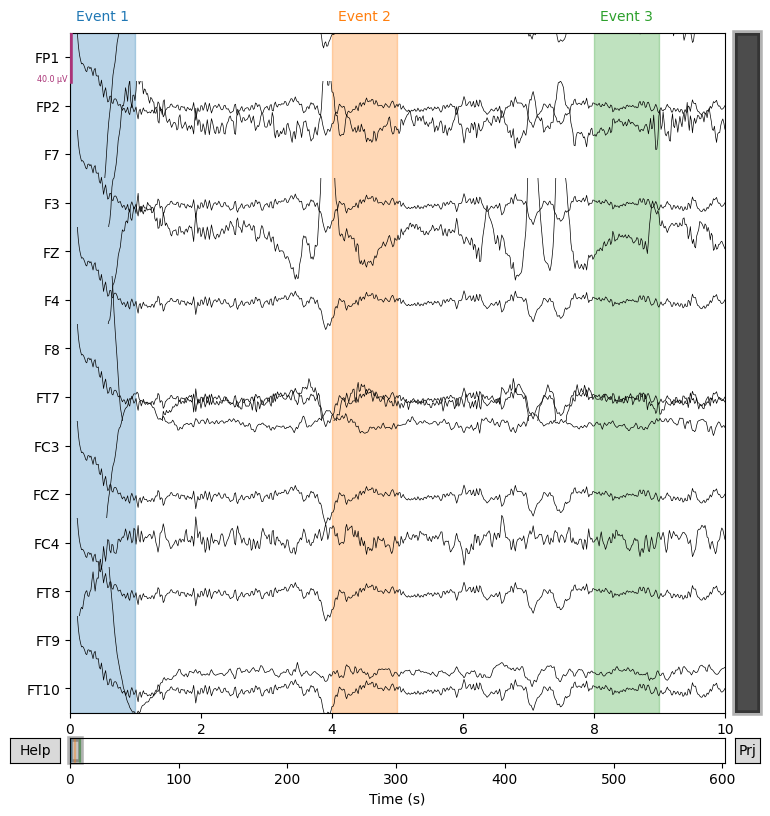

Reading 0 ... 601599  =      0.000 ...   601.599 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.000594  0.000000e+00  0.000950   
1       0.000761  3.137087e-07  0.000353  2.509669e-07  0.001351   
2       0.000000  0.000000e+00  0.000588  0.000000e+00  0.000947   
3       0.000761  3.137087e-07  0.000351  2.509669e-07  0.001349   
4       0.000000  0.000000e+00  0.000580  0.000000e+00  0.000948   
...          ...           ...       ...           ...       ...   
601595  0.000137  3.137087e-07 -0.000048  1.882252e-07  0.000386   
601596  0.000000  0.000000e+00 -0.000264 -6.274174e-08 -0.000068   
601597  0.000134  3.137087e-07 -0.000049  1.882252e-07  0.000384   
601598  0.000000  0.000000e+00 -0.000242 -6.274174e-08 -0.000073   
601599  0.000128  3.137087e-07 -0.000048  1.882252e-07  0.000383   

                  F4        F8           FT7       FC3           FCZ  \
0       0.000000e+00  0.000070 -9.411260e-07  0.001978  1.882252e-07   
1       2.509669e-07  0.000615  1.88225

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.7s finished


Selecting by number: 12 components
Fitting ICA took 27.2s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (11) and smallest (2.1e-37) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


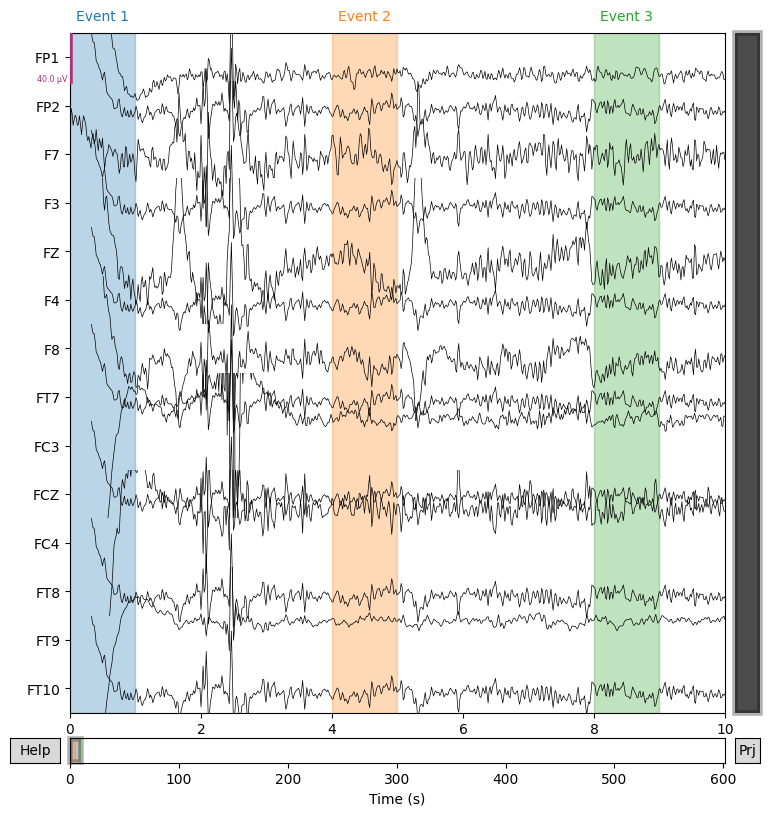

Reading 0 ... 600479  =      0.000 ...   600.479 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1  FP2        F7            F3        FZ            F4  \
0       0.000000  0.0  0.001474  6.274174e-08  0.000972  2.509669e-07   
1       0.001363  0.0 -0.001386  0.000000e+00  0.000573  6.274174e-08   
2       0.000000  0.0  0.001475  6.274174e-08  0.000969  2.509669e-07   
3       0.001363  0.0 -0.001385  0.000000e+00  0.000571  6.274174e-08   
4       0.000000  0.0  0.001474  6.274174e-08  0.000966  2.509669e-07   
...          ...  ...       ...           ...       ...           ...   
600475  0.001500  0.0  0.000522  6.274174e-08  0.001361  6.274174e-08   
600476  0.000000  0.0 -0.001716  6.274174e-08  0.000971  2.509669e-07   
600477  0.001496  0.0  0.000521  6.274174e-08  0.001360  6.274174e-08   
600478  0.000000  0.0 -0.001717  6.274174e-08  0.000974  2.509669e-07   
600479  0.001492  0.0  0.000519  6.274174e-08  0.001357  6.274174e-08   

              F8           FT7       FC3  FCZ       FC4           FT8  \
0      -0.000718  3.764504e-07 -0.000866  0.0 -0.0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 13.5s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (9.4) and smallest (3.8e-38) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


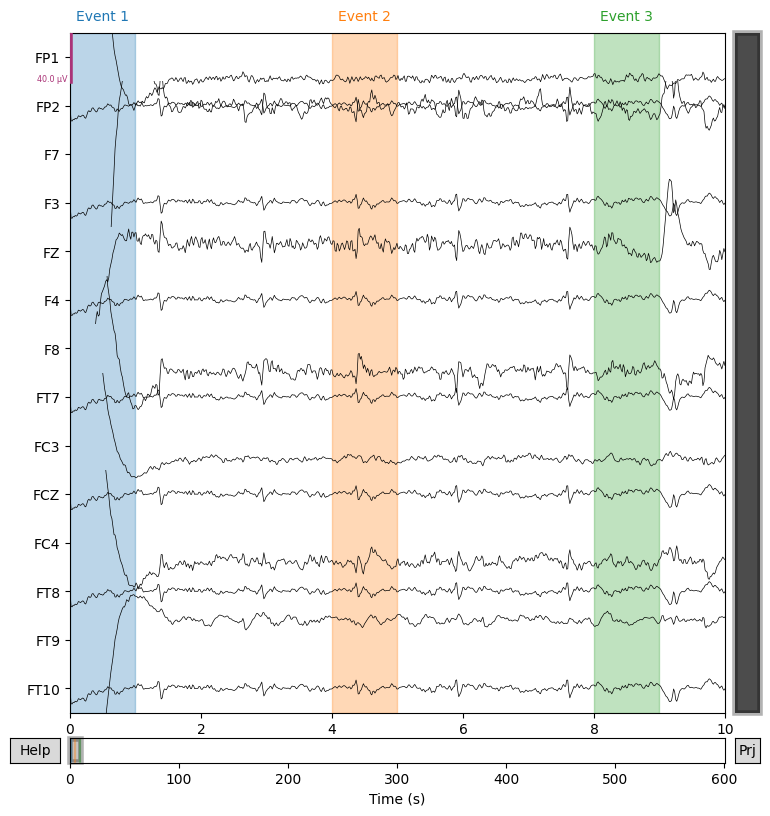

Reading 0 ... 602719  =      0.000 ...   602.719 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.001193  1.882252e-07  0.001410   
1      -0.000914  6.274174e-08 -0.000030  6.274174e-08  0.000151   
2       0.000000  0.000000e+00  0.001194  1.882252e-07  0.001413   
3      -0.000915  6.274174e-08 -0.000030  6.274174e-08  0.000152   
4       0.000000  0.000000e+00  0.001192  1.882252e-07  0.001411   
...          ...           ...       ...           ...       ...   
602715 -0.000446  6.274174e-08  0.000053  1.254835e-07  0.000527   
602716  0.000000  0.000000e+00  0.001517  1.882252e-07  0.000927   
602717 -0.000445  6.274174e-08  0.000053  1.254835e-07  0.000527   
602718  0.000000  0.000000e+00  0.001520  1.882252e-07  0.000929   
602719 -0.000442  6.274174e-08  0.000056  1.254835e-07  0.000531   

                  F4        F8           FT7       FC3  FCZ       FC4  \
0       1.882252e-07 -0.001526  2.509669e-07 -0.001188  0.0 -0.000957   
1       1.882252e-07 -0.001197  1.254

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.6s finished


Selecting by number: 12 components
Fitting ICA took 10.3s.
EEG channel type selected for re-referencing
Applying average reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (11) and smallest (3.4e-37) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


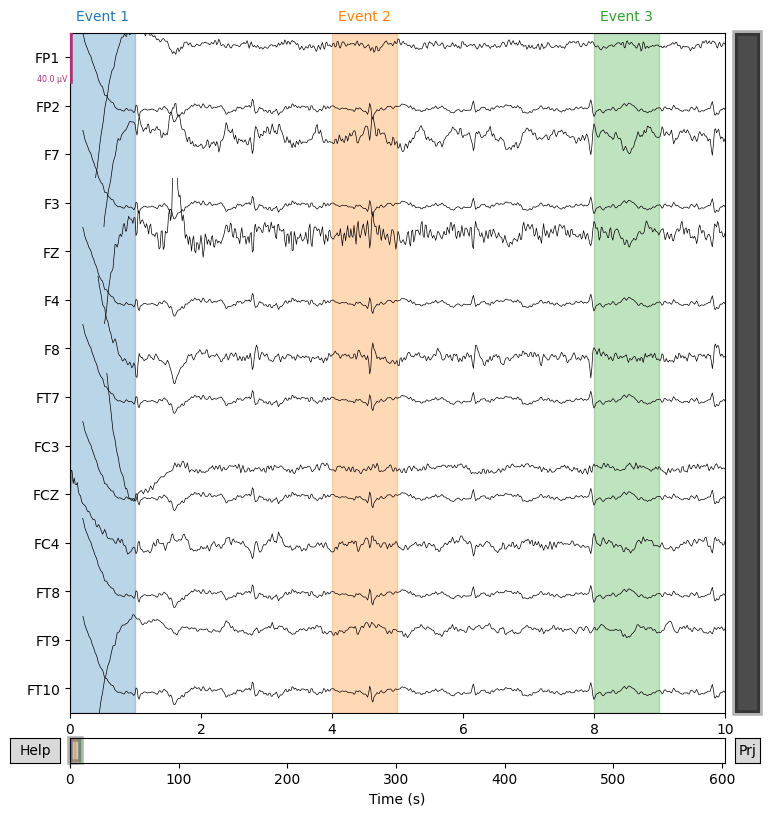

Reading 0 ... 601759  =      0.000 ...   601.759 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3            FZ  \
0       0.000000  0.000000e+00  0.000618  3.137087e-07  1.325043e-03   
1       0.001844  2.509669e-07  0.001854  2.509669e-07  4.246361e-04   
2       0.000000  0.000000e+00  0.000626  3.137087e-07  1.325231e-03   
3       0.001834  2.509669e-07  0.001856  2.509669e-07  4.286515e-04   
4       0.000000  0.000000e+00  0.000631  3.137087e-07  1.328054e-03   
...          ...           ...       ...           ...           ...   
601755 -0.001992  2.509669e-07  0.001627  2.509669e-07  2.321444e-06   
601756  0.000000  0.000000e+00  0.000101  3.137087e-07  1.152566e-03   
601757 -0.001994  2.509669e-07  0.001625  2.509669e-07 -3.764504e-07   
601758  0.000000  0.000000e+00  0.000107  3.137087e-07  1.156079e-03   
601759 -0.001998  2.509669e-07  0.001628  2.509669e-07  1.882252e-06   

                  F4        F8           FT7       FC3           FCZ  \
0       1.254835e-07 -0.001390  1.882252e-07  0.000464  3.13708

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (8.9) and smallest (9.4e-39) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


Fitting ICA took 19.5s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


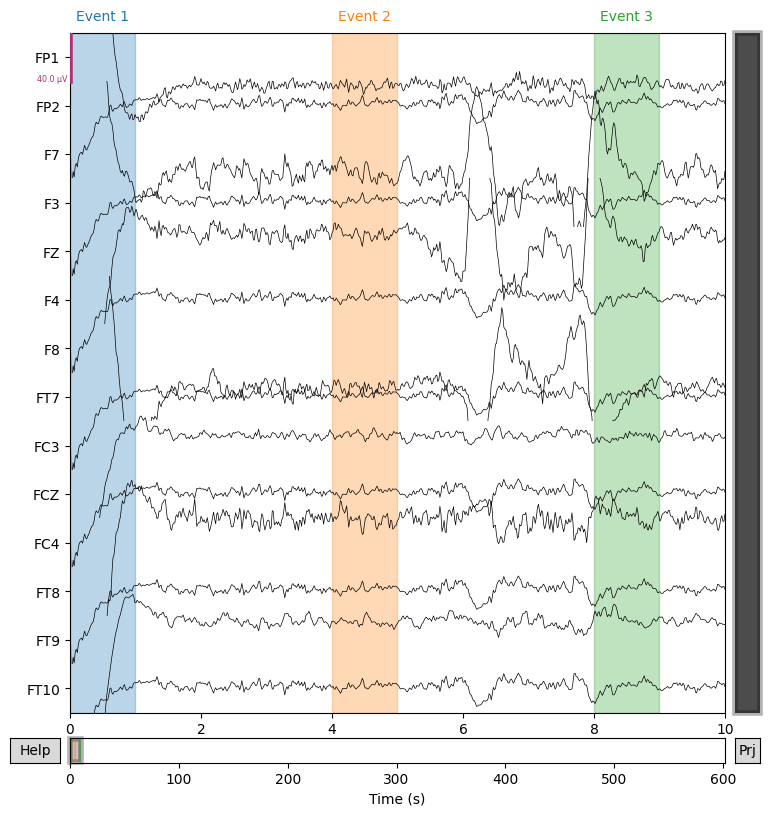

Reading 0 ... 601039  =      0.000 ...   601.039 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.002047  3.764504e-07 -0.001565   
1      -0.001877  2.509669e-07 -0.000477  3.137087e-07  0.000998   
2       0.000000  0.000000e+00  0.002043  3.764504e-07 -0.001568   
3      -0.001866  2.509669e-07 -0.000481  3.137087e-07  0.000992   
4       0.000000  0.000000e+00  0.002037  3.764504e-07 -0.001572   
...          ...           ...       ...           ...       ...   
601035  0.001995  2.509669e-07 -0.001339  3.137087e-07  0.000544   
601036  0.000000  0.000000e+00  0.001812  3.764504e-07 -0.001843   
601037  0.001994  2.509669e-07 -0.001342  3.137087e-07  0.000539   
601038  0.000000  0.000000e+00  0.001805  3.764504e-07 -0.001853   
601039  0.001987  2.509669e-07 -0.001348  3.137087e-07  0.000532   

                  F4        F8           FT7       FC3           FCZ  \
0       1.254835e-07  0.001290  1.882252e-07  0.001909  3.137087e-07   
1       3.137087e-07  0.001644  2.50966

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 6.1s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (6) and smallest (1.6e-38) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


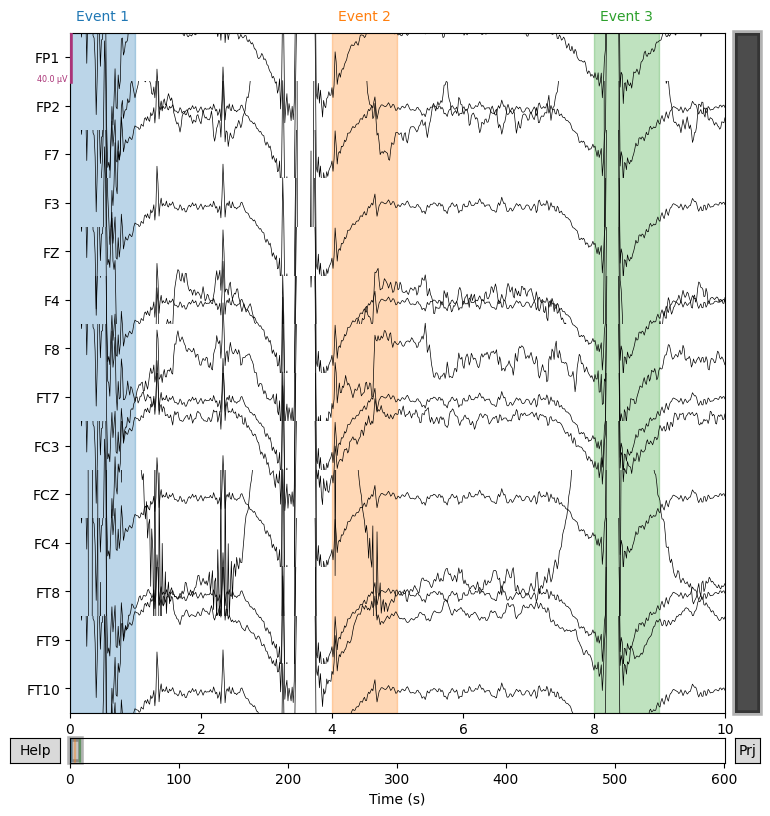

Reading 0 ... 602719  =      0.000 ...   602.719 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.000974  5.019339e-07 -0.001316   
1       0.001912  5.019339e-07 -0.000815  3.137087e-07 -0.001595   
2       0.000000  0.000000e+00  0.001009  5.019339e-07 -0.001312   
3       0.001934  5.019339e-07 -0.000844  3.137087e-07 -0.001604   
4       0.000000  0.000000e+00  0.001057  5.019339e-07 -0.001309   
...          ...           ...       ...           ...       ...   
602715 -0.000852  5.019339e-07 -0.000184  3.137087e-07 -0.000367   
602716  0.000000  0.000000e+00  0.001296  5.019339e-07 -0.000349   
602717 -0.000854  5.019339e-07 -0.000168  3.137087e-07 -0.000354   
602718  0.000000  0.000000e+00  0.001299  5.019339e-07 -0.000350   
602719 -0.000855  5.019339e-07 -0.000157  3.137087e-07 -0.000345   

                  F4        F8           FT7       FC3           FCZ  \
0       1.254835e-07  0.001935  1.882252e-07  0.001813  5.019339e-07   
1       6.901591e-07  0.000106  3.13708

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.6s finished


Selecting by number: 12 components


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (7) and smallest (1.8e-35) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


Fitting ICA took 16.0s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


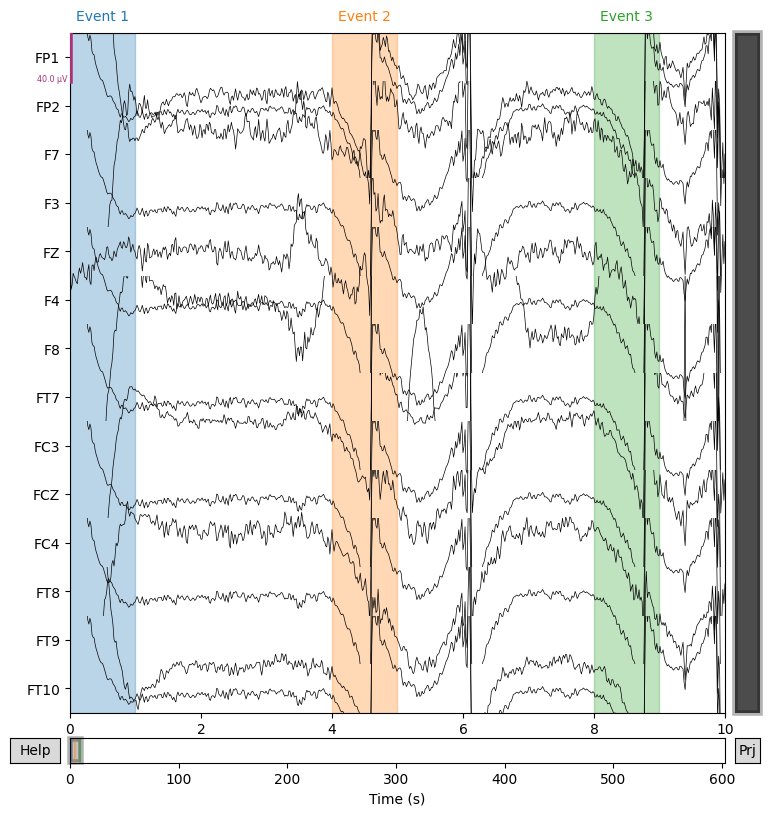

Reading 0 ... 601599  =      0.000 ...   601.599 secs...


/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.000666  3.137087e-07  0.000247   
1       0.000348  2.509669e-07  0.000505  2.509669e-07 -0.001184   
2       0.000000  0.000000e+00  0.000661  3.137087e-07  0.000245   
3       0.000353  2.509669e-07  0.000506  2.509669e-07 -0.001183   
4       0.000000  0.000000e+00  0.000658  3.137087e-07  0.000244   
...          ...           ...       ...           ...       ...   
601595  0.000412  2.509669e-07 -0.000648  1.882252e-07  0.001465   
601596  0.000000  0.000000e+00  0.000551  3.137087e-07 -0.000752   
601597  0.000414  2.509669e-07 -0.000654  1.882252e-07  0.001460   
601598  0.000000  0.000000e+00  0.000550  3.137087e-07 -0.000748   
601599  0.000426  2.509669e-07 -0.000655  1.882252e-07  0.001457   

                  F4        F8           FT7       FC3           FCZ  \
0      -6.274174e-08 -0.001151 -1.882252e-07 -0.001690  2.509669e-07   
1       4.391921e-07 -0.000436  0.00000

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 7.8s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (5.6) and smallest (3.6e-37) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


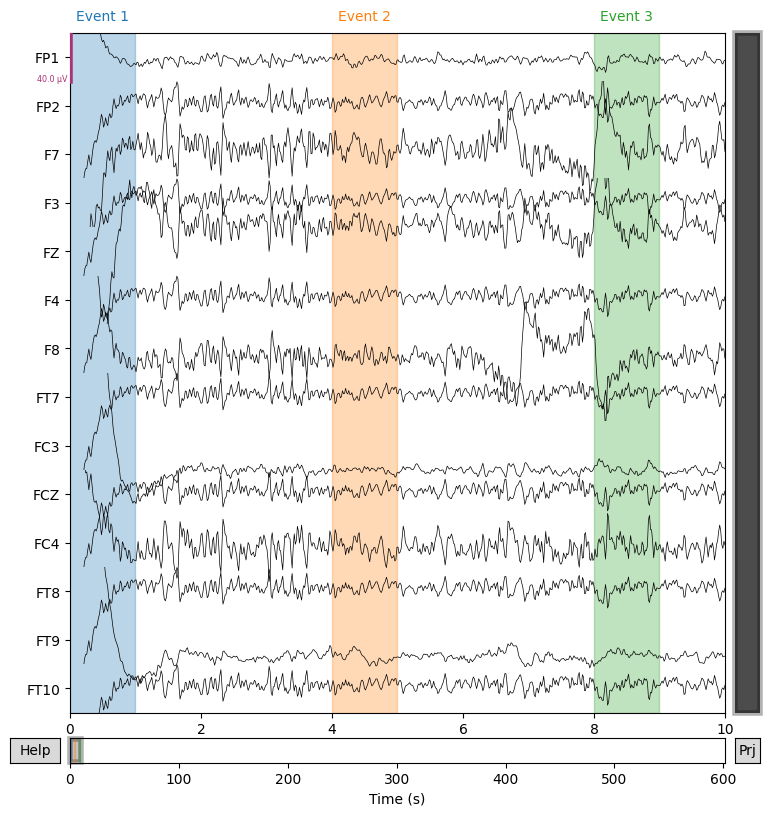

Reading 0 ... 603199  =      0.000 ...   603.199 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00 -0.000704  1.254835e-07  0.000343   
1       0.001961  2.509669e-07  0.001621  2.509669e-07  0.000067   
2       0.000000  0.000000e+00 -0.000703  1.254835e-07  0.000345   
3       0.001963  2.509669e-07  0.001626  2.509669e-07  0.000071   
4       0.000000  0.000000e+00 -0.000701  1.254835e-07  0.000346   
...          ...           ...       ...           ...       ...   
603195 -0.000556  2.509669e-07 -0.001452  2.509669e-07  0.001271   
603196  0.000000  0.000000e+00  0.000843  1.882252e-07  0.001615   
603197 -0.000550  2.509669e-07 -0.001448  2.509669e-07  0.001276   
603198  0.000000  0.000000e+00  0.000850  1.882252e-07  0.001618   
603199 -0.000544  2.509669e-07 -0.001442  2.509669e-07  0.001281   

                  F4        F8           FT7       FC3           FCZ  \
0       2.509669e-07  0.001787  1.882252e-07 -0.000473  1.882252e-07   
1       3.137087e-07 -0.000246  1.25483

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.6s finished


Selecting by number: 12 components
Fitting ICA took 9.9s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (7.7) and smallest (9.7e-10) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


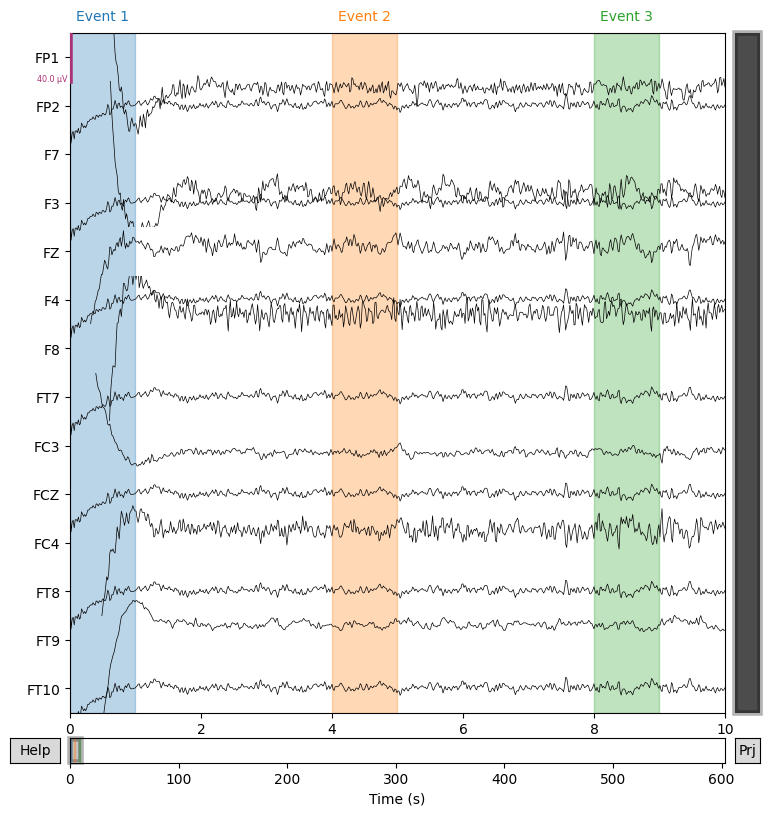

Reading 0 ... 603119  =      0.000 ...   603.119 secs...


/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00 -0.000126 -1.254835e-07 -0.000978   
1      -0.000245  6.274174e-08 -0.000298  0.000000e+00 -0.000019   
2       0.000000  0.000000e+00 -0.000123 -1.254835e-07 -0.000980   
3      -0.000231  6.274174e-08 -0.000295  0.000000e+00 -0.000013   
4       0.000000  0.000000e+00 -0.000127 -1.254835e-07 -0.000988   
...          ...           ...       ...           ...       ...   
603115  0.000932  1.254835e-07  0.001079  6.274174e-08 -0.001612   
603116  0.000000  0.000000e+00  0.000842 -6.274174e-08  0.000170   
603117  0.000933  1.254835e-07  0.001076  6.274174e-08 -0.001613   
603118  0.000000  0.000000e+00  0.000842 -6.274174e-08  0.000172   
603119  0.000925  1.254835e-07  0.001074  6.274174e-08 -0.001617   

                  F4        F8           FT7       FC3           FCZ  \
0       6.274174e-08 -0.001988  6.274174e-08 -0.000656  1.254835e-07   
1       6.274174e-08 -0.000146  6.27417

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (7.4) and smallest (1.1e-10) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


Fitting ICA took 26.5s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


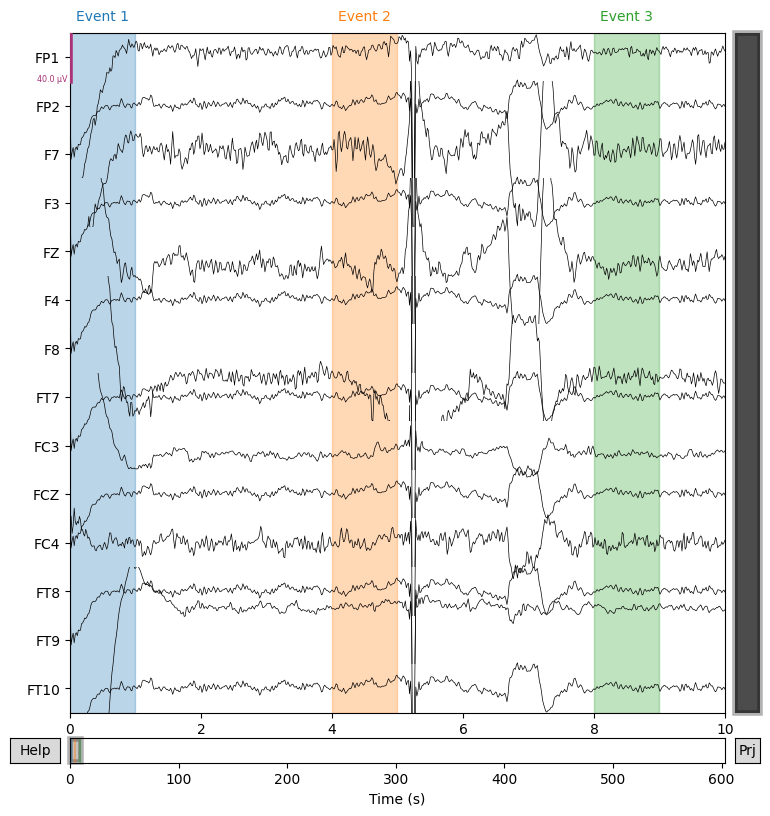

Reading 0 ... 600879  =      0.000 ...   600.879 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.000591  3.764504e-07  0.001728   
1      -0.000325  3.137087e-07  0.001080  4.391921e-07 -0.000064   
2       0.000000  0.000000e+00  0.000586  3.764504e-07  0.001724   
3      -0.000327  3.137087e-07  0.001079  4.391921e-07 -0.000064   
4       0.000000  0.000000e+00  0.000585  3.764504e-07  0.001725   
...          ...           ...       ...           ...       ...   
600875  0.000316  3.764504e-07  0.002017  4.391921e-07  0.000782   
600876  0.000000  0.000000e+00  0.001734  3.764504e-07 -0.001608   
600877  0.000311  3.764504e-07  0.002017  4.391921e-07  0.000781   
600878  0.000000  0.000000e+00  0.001733  3.764504e-07 -0.001607   
600879  0.000315  3.764504e-07  0.002022  4.391921e-07  0.000786   

                  F4        F8           FT7       FC3           FCZ  \
0       2.509669e-07  0.001346  3.137087e-07 -0.001809  3.137087e-07   
1       3.137087e-07  0.000864  3.76450

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.4s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    1.1s finished


Selecting by number: 12 components
Fitting ICA took 16.4s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (6.2) and smallest (9.9e-11) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


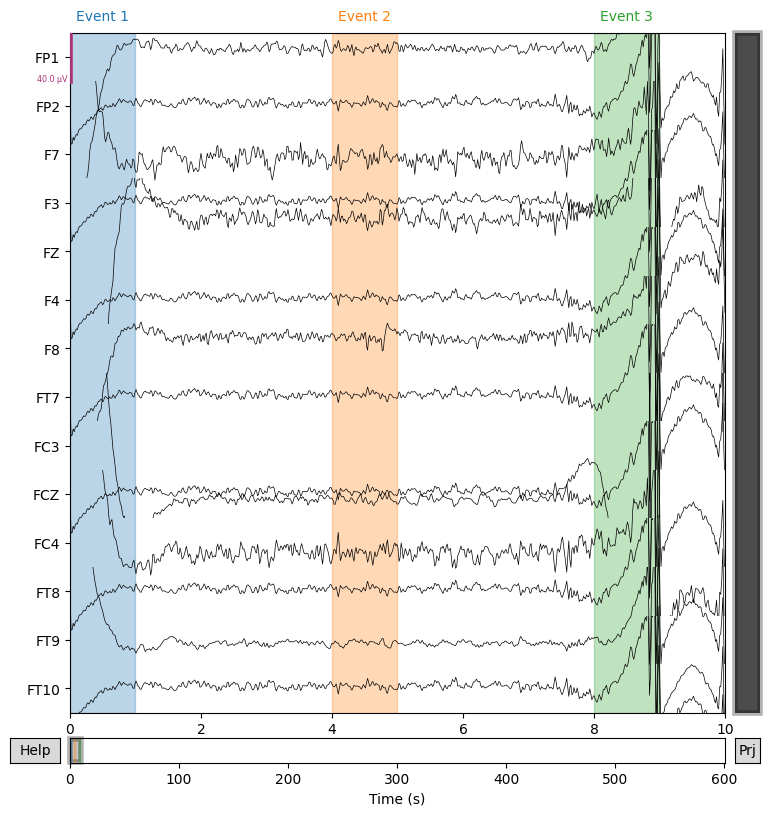

Reading 0 ... 601519  =      0.000 ...   601.519 secs...


/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.001093  1.254835e-07  0.000011   
1       0.001584  3.137087e-07  0.001018  2.509669e-07 -0.001300   
2       0.000000  0.000000e+00  0.001095  1.254835e-07  0.000019   
3       0.001592  3.137087e-07  0.001031  2.509669e-07 -0.001291   
4       0.000000  0.000000e+00  0.001099  1.254835e-07  0.000021   
...          ...           ...       ...           ...       ...   
601515  0.000612  3.137087e-07  0.000891  2.509669e-07 -0.001245   
601516  0.000000  0.000000e+00  0.001443  1.254835e-07 -0.000184   
601517  0.000614  3.137087e-07  0.000884  2.509669e-07 -0.001243   
601518  0.000000  0.000000e+00  0.001453  1.254835e-07 -0.000183   
601519  0.000617  3.137087e-07  0.000882  2.509669e-07 -0.001241   

                  F4        F8           FT7       FC3           FCZ  \
0       1.254835e-07 -0.000560  1.882252e-07 -0.000131  1.882252e-07   
1       1.882252e-07 -0.001679  1.88225

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 11.9s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (11) and smallest (1.1e-33) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


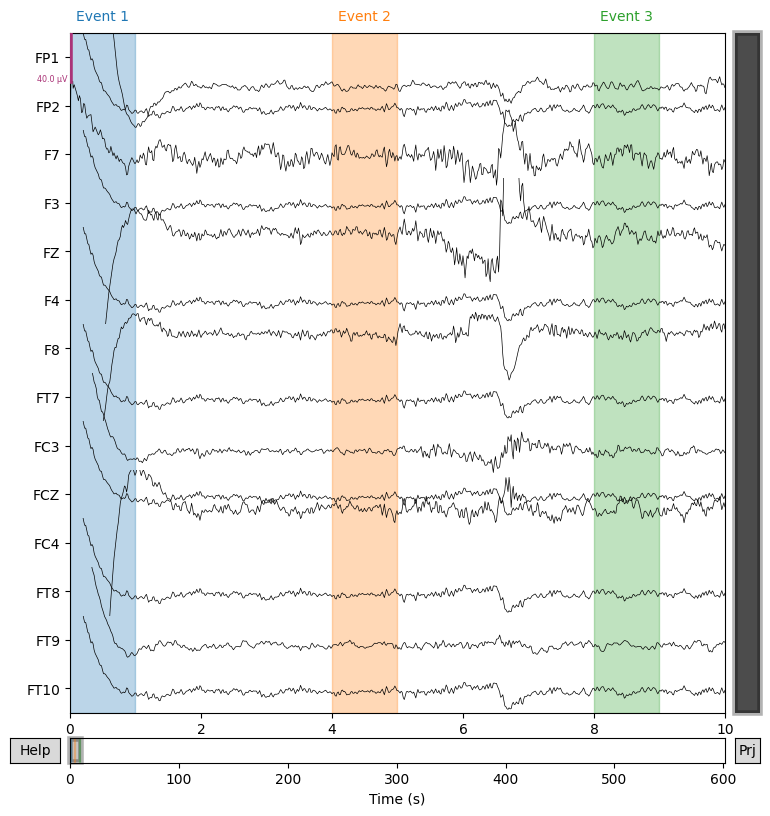

Reading 0 ... 599999  =      0.000 ...   599.999 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.001827  0.000000e+00  0.000896   
1      -0.000113  0.000000e+00  0.001783  1.254835e-07  0.000828   
2       0.000000  0.000000e+00  0.001827  0.000000e+00  0.000898   
3      -0.000113  0.000000e+00  0.001783  1.254835e-07  0.000827   
4       0.000000  0.000000e+00  0.001823  0.000000e+00  0.000894   
...          ...           ...       ...           ...       ...   
599995 -0.001969  6.274174e-08  0.000637  1.882252e-07 -0.000960   
599996  0.000000  0.000000e+00  0.000659  6.274174e-08 -0.001886   
599997 -0.001967  6.274174e-08  0.000636  1.882252e-07 -0.000960   
599998  0.000000  0.000000e+00  0.000662  6.274174e-08 -0.001885   
599999 -0.001965  6.274174e-08  0.000638  1.882252e-07 -0.000959   

                  F4        F8           FT7       FC3           FCZ  \
0       6.274174e-08 -0.000762 -1.317576e-06  0.000364  1.254835e-07   
1       6.274174e-08 -0.001993  1.25483

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 15.4s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.1) and smallest (4.2e-12) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


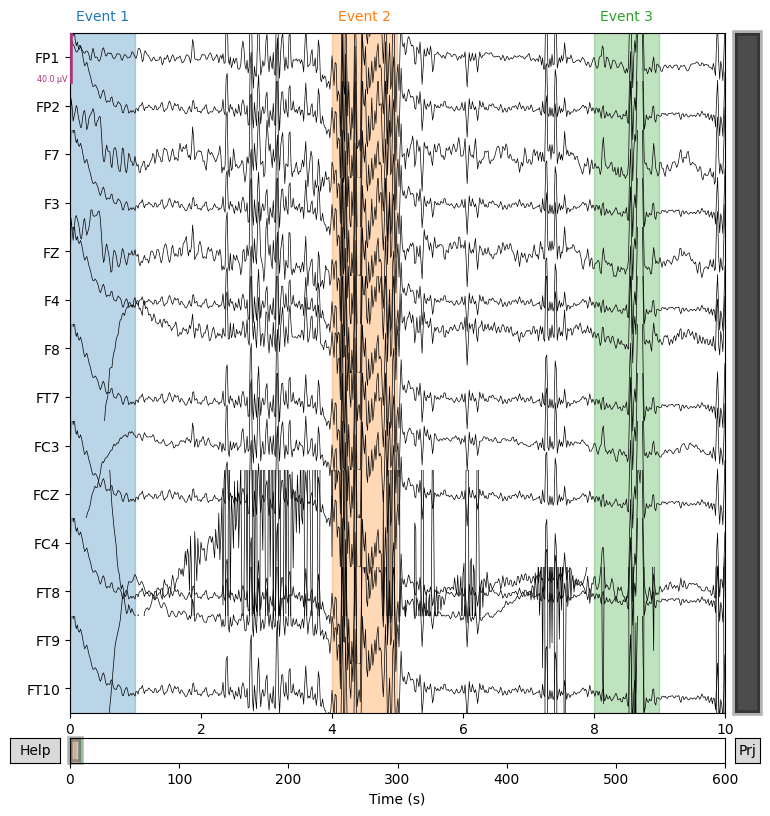

Reading 0 ... 601439  =      0.000 ...   601.439 secs...


/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.000937  3.137087e-07 -0.000092   
1       0.001875  3.764504e-07  0.001142  4.391921e-07 -0.001287   
2       0.000000  0.000000e+00  0.000936  3.137087e-07 -0.000096   
3       0.001876  3.764504e-07  0.001142  4.391921e-07 -0.001288   
4       0.000000  0.000000e+00  0.000939  3.137087e-07 -0.000094   
...          ...           ...       ...           ...       ...   
601435  0.000792  4.391921e-07 -0.000321  4.391921e-07  0.001014   
601436  0.000000  0.000000e+00 -0.000783  3.137087e-07 -0.001467   
601437  0.000796  4.391921e-07 -0.000316  4.391921e-07  0.001019   
601438  0.000000  0.000000e+00 -0.000788  3.137087e-07 -0.001474   
601439  0.000800  4.391921e-07 -0.000314  4.391921e-07  0.001018   

                  F4        F8           FT7       FC3           FCZ  \
0       1.254835e-07  0.001120 -1.003868e-06  0.000355  3.764504e-07   
1       3.764504e-07  0.000600  5.01933

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.6s finished


Selecting by number: 12 components
Fitting ICA took 9.0s.
EEG channel type selected for re-referencing


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (5.1) and smallest (8.4e-11) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


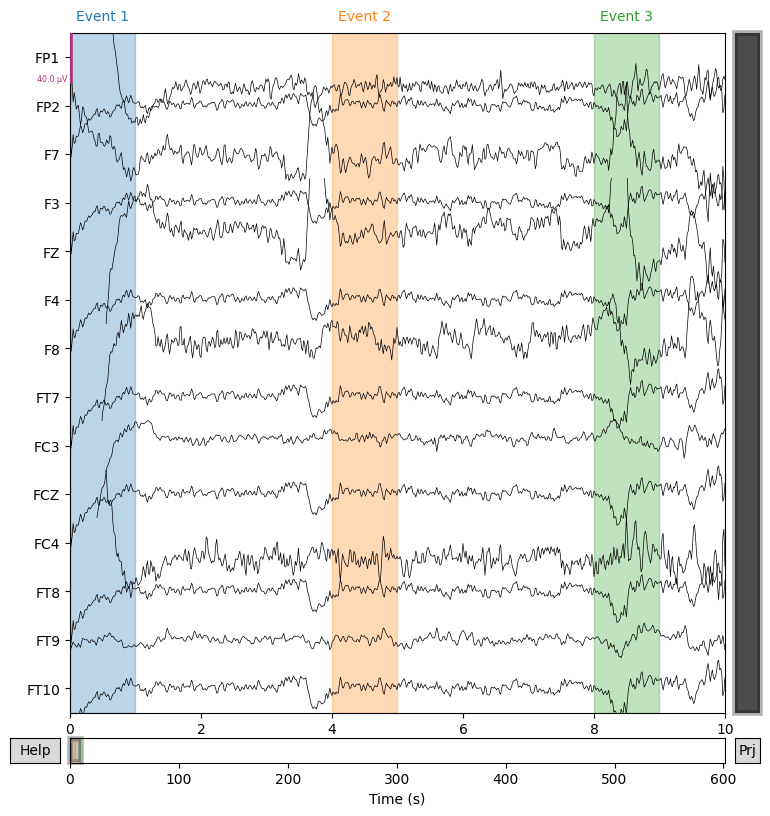

Reading 0 ... 601199  =      0.000 ...   601.199 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.000728 -1.254835e-07 -0.001407   
1      -0.000866 -6.274174e-08 -0.001103  2.509669e-07 -0.001646   
2       0.000000  0.000000e+00  0.000723 -1.254835e-07 -0.001411   
3      -0.000867 -6.274174e-08 -0.001101  2.509669e-07 -0.001646   
4       0.000000  0.000000e+00  0.000722 -1.254835e-07 -0.001414   
...          ...           ...       ...           ...       ...   
601195 -0.000831 -6.274174e-08 -0.001088  2.509669e-07 -0.001605   
601196  0.000000  0.000000e+00  0.000078 -1.254835e-07 -0.001306   
601197 -0.000829 -6.274174e-08 -0.001083  2.509669e-07 -0.001603   
601198  0.000000  0.000000e+00  0.000082 -1.254835e-07 -0.001301   
601199 -0.000835 -6.274174e-08 -0.001085  2.509669e-07 -0.001603   

                  F4        F8           FT7       FC3           FCZ  \
0       0.000000e+00 -0.000547 -1.003868e-06 -0.001247 -6.274174e-08   
1       6.274174e-08 -0.001860  6.27417

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 16.9s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (4.9) and smallest (1.9e-37) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


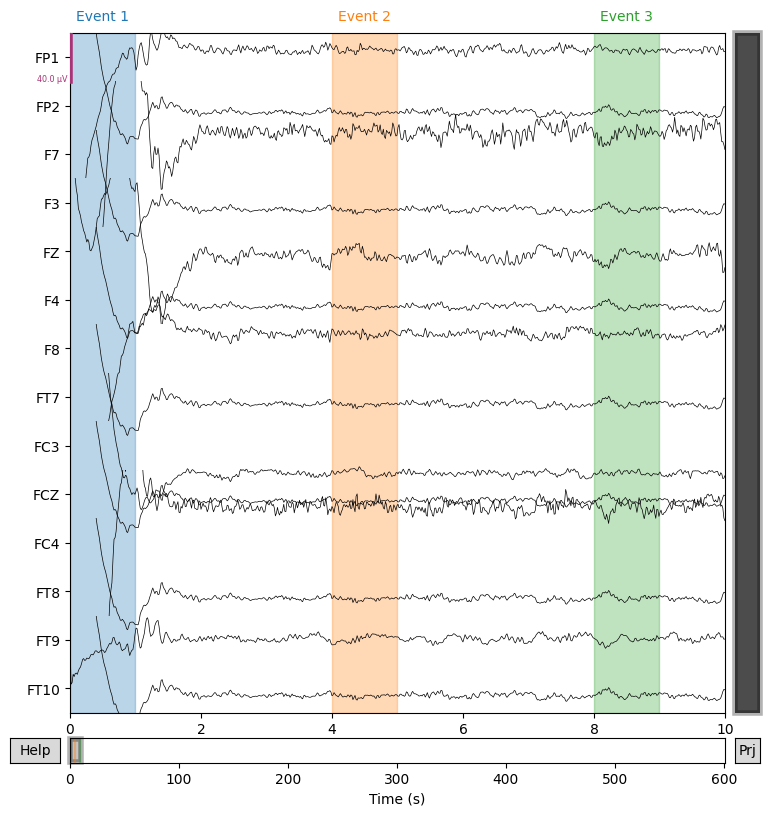

Reading 0 ... 601759  =      0.000 ...   601.759 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1  FP2        F7            F3        FZ            F4  \
0       0.000000  0.0  0.001530 -6.274174e-08 -0.000879  6.274174e-08   
1      -0.001927  0.0  0.001020  3.137087e-07  0.001081  6.274174e-08   
2       0.000000  0.0  0.001530 -6.274174e-08 -0.000876  6.274174e-08   
3      -0.001914  0.0  0.001024  3.137087e-07  0.001086  6.274174e-08   
4       0.000000  0.0  0.001532 -6.274174e-08 -0.000875  6.274174e-08   
...          ...  ...       ...           ...       ...           ...   
601755 -0.001521  0.0  0.001780  3.137087e-07 -0.001576  6.274174e-08   
601756  0.000000  0.0 -0.001723 -6.274174e-08 -0.000426  6.274174e-08   
601757 -0.001521  0.0  0.001777  3.137087e-07 -0.001577  6.274174e-08   
601758  0.000000  0.0 -0.001720 -6.274174e-08 -0.000422  6.274174e-08   
601759 -0.001518  0.0  0.001777  3.137087e-07 -0.001576  6.274174e-08   

              F8           FT7       FC3           FCZ           FC4  \
0       0.000941 -8.783843e-07  0.000512 -6.274174e

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 9.1s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (7.6) and smallest (1.8e-38) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


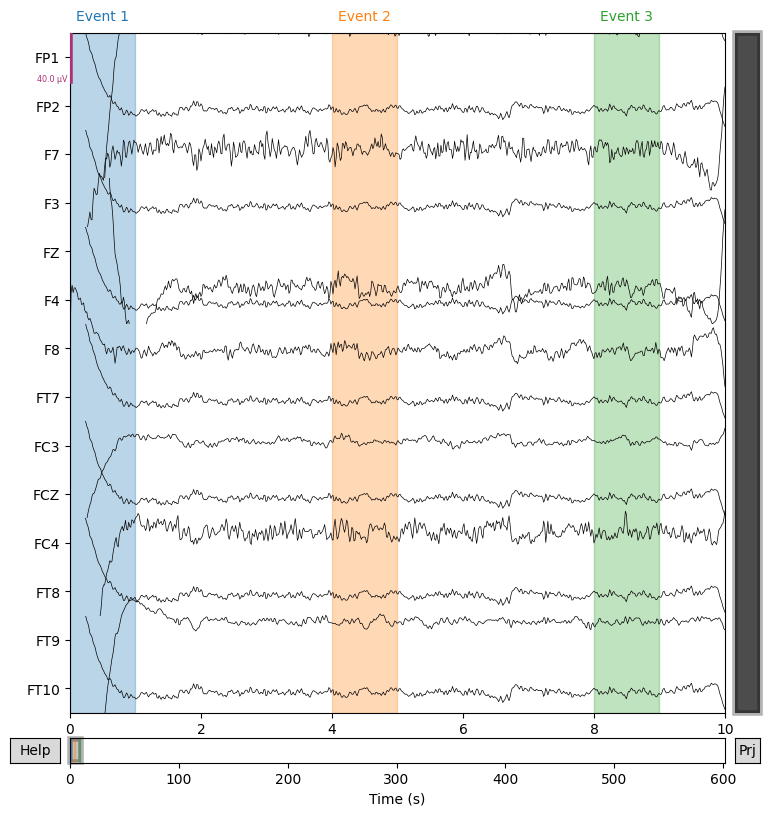

Reading 0 ... 600239  =      0.000 ...   600.239 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7   F3        FZ            F4  \
0       0.000000  0.000000e+00 -0.001180  0.0 -0.000166  0.000000e+00   
1      -0.000885 -6.274174e-08 -0.001185  0.0  0.000561  0.000000e+00   
2       0.000000  0.000000e+00 -0.001181  0.0 -0.000169  0.000000e+00   
3      -0.000888 -6.274174e-08 -0.001185  0.0  0.000561  0.000000e+00   
4       0.000000  0.000000e+00 -0.001177  0.0 -0.000170  0.000000e+00   
...          ...           ...       ...  ...       ...           ...   
600235 -0.000444 -6.274174e-08 -0.001050  0.0  0.000916  0.000000e+00   
600236  0.000000  0.000000e+00 -0.000593  0.0  0.000240  6.274174e-08   
600237 -0.000442 -6.274174e-08 -0.001049  0.0  0.000916  0.000000e+00   
600238  0.000000  0.000000e+00 -0.000595  0.0  0.000239  6.274174e-08   
600239 -0.000442 -6.274174e-08 -0.001051  0.0  0.000914  0.000000e+00   

              F8           FT7       FC3  FCZ       FC4           FT8  \
0       0.000136  1.254835e-07 -0.001627  0.0 -0.0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 11.8s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (8.6) and smallest (1.9e-34) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


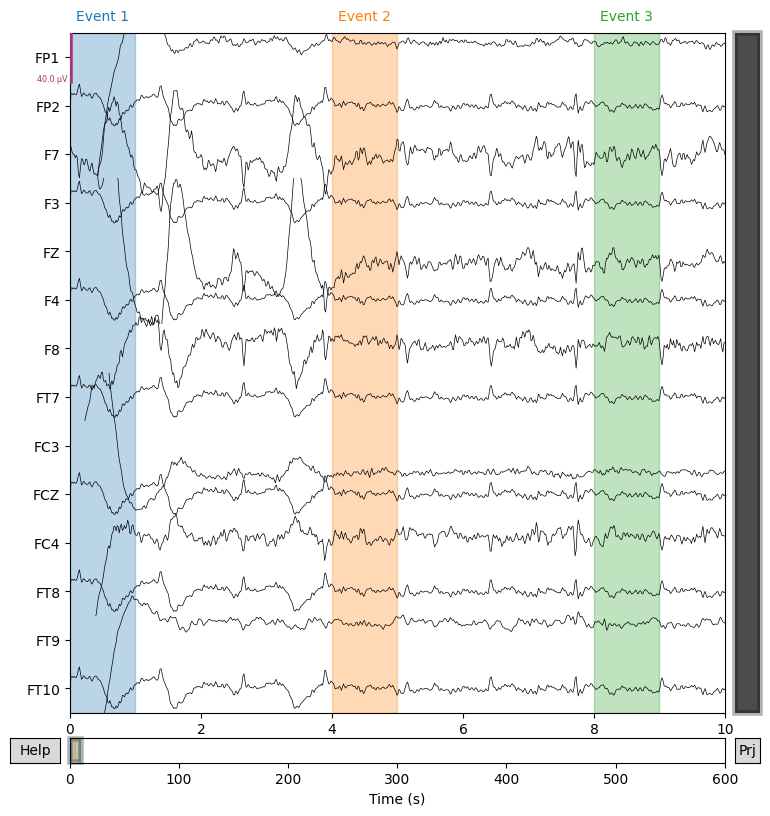

Reading 0 ... 600479  =      0.000 ...   600.479 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ   F4  \
0       0.000000  0.000000e+00  0.001523 -6.274174e-08 -0.000613  0.0   
1       0.001759 -6.274174e-08  0.000002  6.274174e-08 -0.001931  0.0   
2       0.000000  0.000000e+00  0.001529 -6.274174e-08 -0.000609  0.0   
3       0.001758 -6.274174e-08  0.000004  6.274174e-08 -0.001931  0.0   
4       0.000000  0.000000e+00  0.001524 -6.274174e-08 -0.000608  0.0   
...          ...           ...       ...           ...       ...  ...   
600475  0.001918 -6.274174e-08 -0.000560  0.000000e+00  0.001843  0.0   
600476  0.000000  0.000000e+00 -0.001958 -6.274174e-08 -0.000574  0.0   
600477  0.001923 -6.274174e-08 -0.000556  0.000000e+00  0.001847  0.0   
600478  0.000000  0.000000e+00 -0.001958 -6.274174e-08 -0.000572  0.0   
600479  0.001923 -6.274174e-08 -0.000553  0.000000e+00  0.001851  0.0   

              F8           FT7       FC3  FCZ       FC4           FT8  \
0      -0.000519  1.254835e-07  0.001100  0.0 -0.0

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (8.2) and smallest (1.3e-36) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


Fitting ICA took 20.1s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


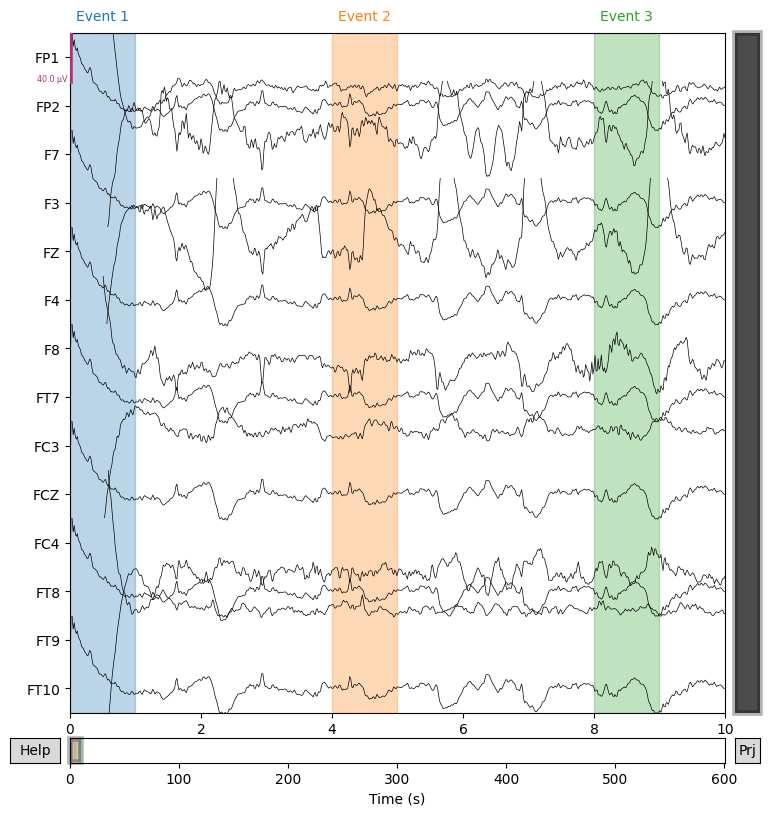

Reading 0 ... 601039  =      0.000 ...   601.039 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.002039 -3.764504e-07  0.001657   
1      -0.000522 -3.764504e-07  0.000326 -2.509669e-07 -0.001292   
2       0.000000  0.000000e+00 -0.002056 -3.764504e-07  0.001654   
3      -0.000519 -3.764504e-07  0.000321 -2.509669e-07 -0.001299   
4       0.000000  0.000000e+00 -0.002037 -3.764504e-07  0.001657   
...          ...           ...       ...           ...       ...   
601035 -0.000359 -3.764504e-07  0.000451 -2.509669e-07 -0.001102   
601036  0.000000  0.000000e+00 -0.001844 -3.764504e-07  0.001778   
601037 -0.000354 -3.764504e-07  0.000451 -2.509669e-07 -0.001098   
601038  0.000000  0.000000e+00 -0.001847 -3.764504e-07  0.001783   
601039 -0.000353 -3.764504e-07  0.000454 -2.509669e-07 -0.001093   

                  F4        F8           FT7       FC3           FCZ  \
0      -1.882252e-07 -0.000885 -6.274174e-08  0.000432 -1.882252e-07   
1      -3.764504e-07  0.001020 -4.39192

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (12) and smallest (4.5e-38) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


Fitting ICA took 7.2s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


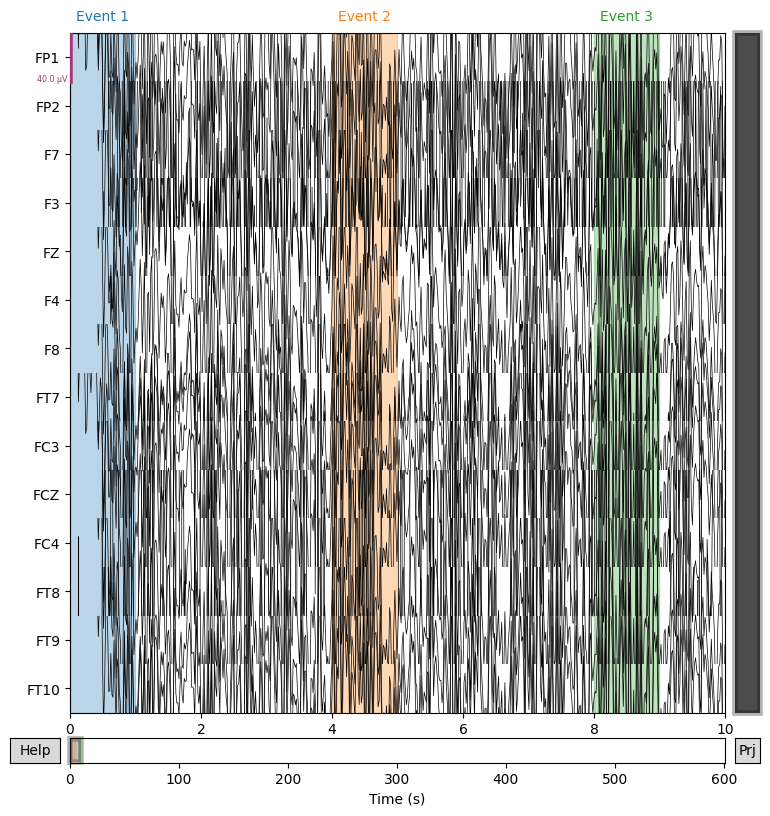

Reading 0 ... 600879  =      0.000 ...   600.879 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00 -0.001346 -3.764504e-07 -0.000313   
1       0.001806 -3.764504e-07 -0.001882 -1.882252e-07  0.000540   
2       0.000000  0.000000e+00 -0.001351 -3.764504e-07 -0.000316   
3       0.001797 -3.764504e-07 -0.001889 -1.882252e-07  0.000536   
4       0.000000  0.000000e+00 -0.001351 -3.764504e-07 -0.000320   
...          ...           ...       ...           ...       ...   
600875  0.001218 -3.764504e-07 -0.001617 -1.882252e-07 -0.001253   
600876  0.000000  0.000000e+00  0.001905 -3.764504e-07  0.000289   
600877  0.001220 -3.764504e-07 -0.001618 -1.882252e-07 -0.001254   
600878  0.000000  0.000000e+00  0.001906 -3.764504e-07  0.000291   
600879  0.001221 -3.764504e-07 -0.001616 -1.882252e-07 -0.001252   

                  F4        F8           FT7       FC3           FCZ  \
0      -2.509669e-07 -0.001417 -6.274174e-08 -0.001396 -1.882252e-07   
1      -2.509669e-07  0.001428 -3.76450

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 11.0s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (9.6) and smallest (2e-35) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


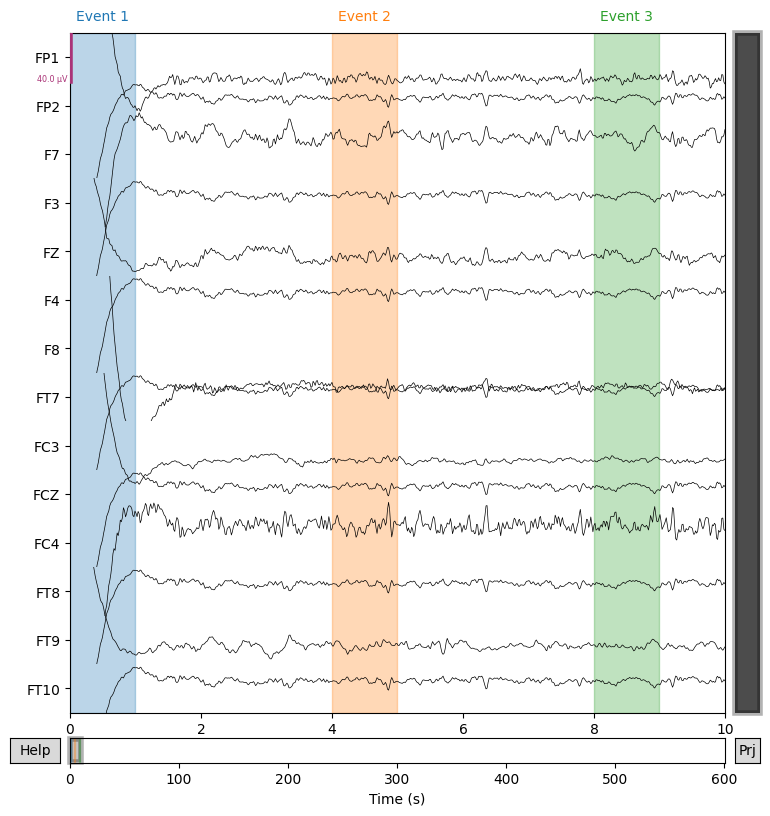

Reading 0 ... 602399  =      0.000 ...   602.399 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00 -0.000602  1.882252e-07  0.000075   
1       0.000488  1.882252e-07  0.000326  4.391921e-07 -0.000411   
2       0.000000  0.000000e+00 -0.000603  1.882252e-07  0.000077   
3       0.000488  1.882252e-07  0.000324  4.391921e-07 -0.000415   
4       0.000000  0.000000e+00 -0.000599  1.882252e-07  0.000087   
...          ...           ...       ...           ...       ...   
602395 -0.000722  1.254835e-07 -0.000261  3.764504e-07 -0.001689   
602396  0.000000  0.000000e+00 -0.000554  1.882252e-07 -0.000657   
602397 -0.000724  1.254835e-07 -0.000262  3.764504e-07 -0.001685   
602398  0.000000  0.000000e+00 -0.000557  1.882252e-07 -0.000662   
602399 -0.000726  1.254835e-07 -0.000264  3.764504e-07 -0.001688   

                  F4        F8           FT7       FC3           FCZ  \
0       6.274174e-08 -0.000980  6.274174e-08  0.000492  1.254835e-07   
1       5.019339e-07  0.000971  1.25483

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 12.5s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (5.4) and smallest (4.9e-10) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


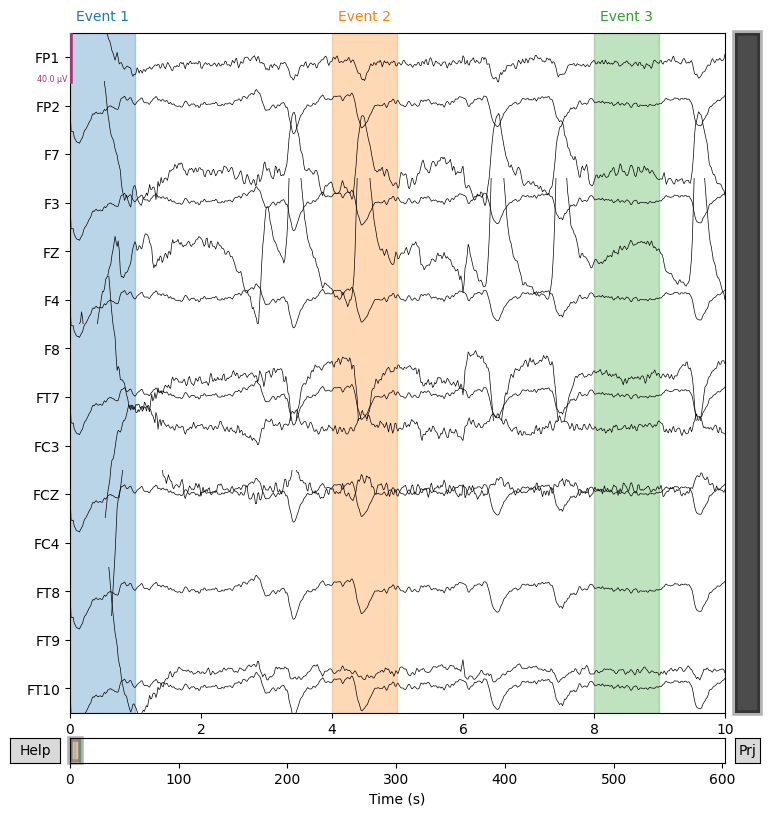

Reading 0 ... 601519  =      0.000 ...   601.519 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00 -0.000363  1.254835e-07  0.000838   
1      -0.001066  1.254835e-07  0.000511  3.764504e-07 -0.001585   
2       0.000000  0.000000e+00 -0.000363  1.254835e-07  0.000841   
3      -0.001065  1.254835e-07  0.000506  3.764504e-07 -0.001585   
4       0.000000  0.000000e+00 -0.000364  1.254835e-07  0.000845   
...          ...           ...       ...           ...       ...   
601515 -0.001153  1.254835e-07  0.000758  3.764504e-07 -0.001859   
601516  0.000000  0.000000e+00 -0.000172  1.254835e-07  0.000908   
601517 -0.001153  1.254835e-07  0.000761  3.764504e-07 -0.001857   
601518  0.000000  0.000000e+00 -0.000168  1.254835e-07  0.000907   
601519 -0.001153  1.254835e-07  0.000767  3.764504e-07 -0.001856   

                  F4        F8           FT7       FC3           FCZ  \
0       0.000000e+00 -0.000323  0.000000e+00 -0.000054  1.254835e-07   
1       5.019339e-07 -0.000939  6.27417

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 12.1s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (9.7) and smallest (1.5e-09) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


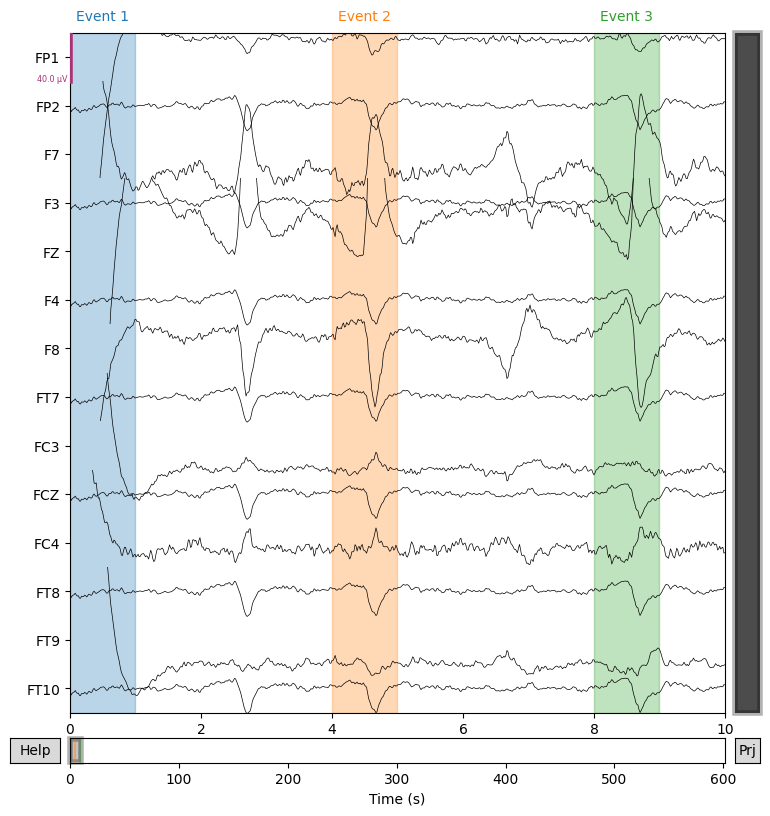

Reading 0 ... 601119  =      0.000 ...   601.119 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00 -0.000061 -6.274174e-08 -0.000517   
1      -0.001949  1.254835e-07  0.000571  4.391921e-07  0.001105   
2       0.000000  0.000000e+00 -0.000068 -6.274174e-08 -0.000519   
3      -0.001951  1.254835e-07  0.000565  4.391921e-07  0.001102   
4       0.000000  0.000000e+00 -0.000078 -6.274174e-08 -0.000521   
...          ...           ...       ...           ...       ...   
601115 -0.000933  1.254835e-07  0.001132  4.391921e-07 -0.001858   
601116  0.000000  0.000000e+00  0.000076  0.000000e+00 -0.000026   
601117 -0.000934  1.254835e-07  0.001128  4.391921e-07 -0.001861   
601118  0.000000  0.000000e+00  0.000073  0.000000e+00 -0.000031   
601119 -0.000938  1.254835e-07  0.001124  4.391921e-07 -0.001869   

                  F4        F8           FT7       FC3           FCZ  \
0       0.000000e+00  0.000366  1.254835e-07 -0.001876  6.274174e-08   
1       1.254835e-07 -0.001713  0.00000

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 9.7s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (8.9) and smallest (8.1e-38) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


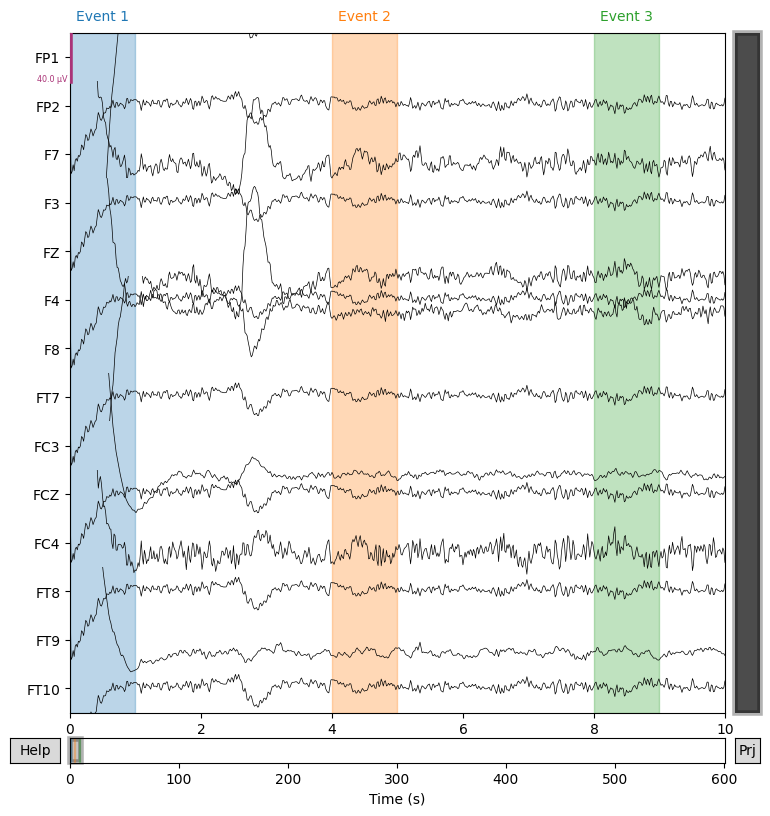

Reading 0 ... 601519  =      0.000 ...   601.519 secs...


<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = mne.io.read_raw_cnt(file_path, preload=True)
<ipython-input-55-12c04d0cf37c>:3: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt(file_path, preload=True)


             FP1           FP2        F7            F3        FZ  \
0       0.000000  0.000000e+00  0.000466  0.000000e+00  0.000104   
1       0.000451  1.254835e-07  0.000715  3.137087e-07  0.001137   
2       0.000000  0.000000e+00  0.000473  0.000000e+00  0.000110   
3       0.000446  1.254835e-07  0.000718  3.137087e-07  0.001139   
4       0.000000  0.000000e+00  0.000476  0.000000e+00  0.000114   
...          ...           ...       ...           ...       ...   
601515  0.000640  1.254835e-07  0.001334  3.137087e-07  0.000652   
601516  0.000000  0.000000e+00  0.000281  0.000000e+00 -0.001011   
601517  0.000638  1.254835e-07  0.001331  3.137087e-07  0.000654   
601518  0.000000  0.000000e+00  0.000282  0.000000e+00 -0.001005   
601519  0.000643  1.254835e-07  0.001337  3.137087e-07  0.000662   

                  F4        F8           FT7       FC3  FCZ       FC4  \
0       6.274174e-08  0.001707  6.274174e-08 -0.000681  0.0  0.000826   
1       6.274174e-08 -0.002017  0.000

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 14 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished


Selecting by number: 12 components
Fitting ICA took 12.5s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<ipython-input-55-12c04d0cf37c>:14: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (11) and smallest (4.7e-38) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 7
  ica.fit(raw_f)


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated


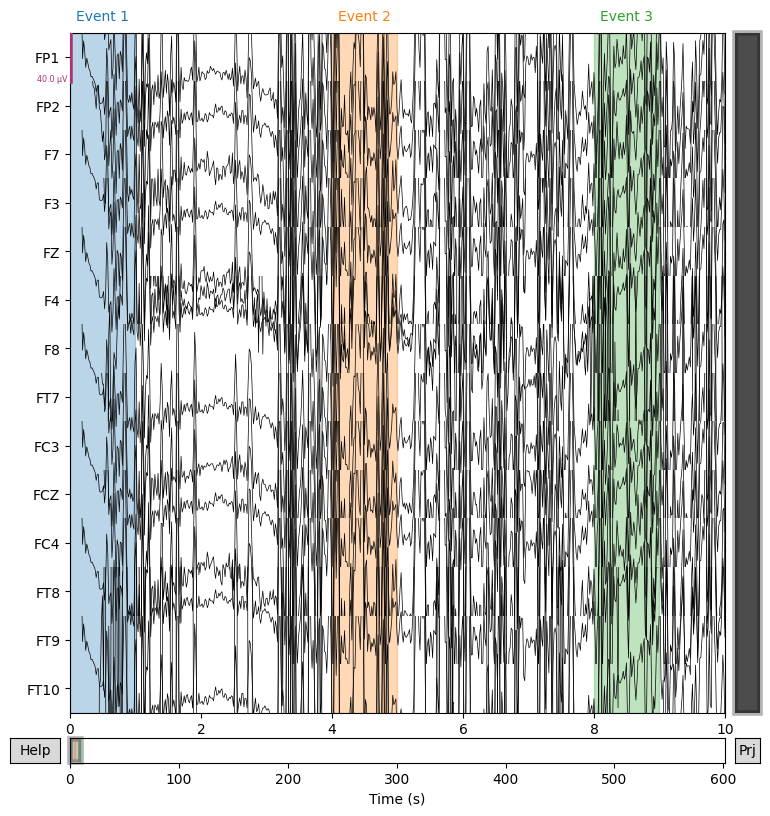

In [ ]:
sample_data=[read_data(i) for i in all_file_path]
#data=read_data("/content/drive/MyDrive/preprocessed/sub0.set")
# content=mne.io.read_raw_eeglab("/content/drive/MyDrive/preprocessed/sub0.set", eog=(), preload=True)
# data=content.get_data()
# print(len(sample_data))


In [ ]:
raw = mne.io.read_raw_cnt('/content/drive/MyDrive/cntfiles/Raw Data/2/2/Fatigue state.cnt', preload=True)
f_channels = [ch_name for ch_name in raw.ch_names if ch_name.startswith('F')]
len(f_channels)

Reading 0 ... 601439  =      0.000 ...   601.439 secs...


/usr/local/lib/python3.9/dist-packages/mne/io/cnt/cnt.py:240: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
<ipython-input-58-06f09e034e2c>:1: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = mne.io.read_raw_cnt('/content/drive/MyDrive/cntfiles/Raw Data/2/2/Fatigue state.cnt', preload=True)


14

In [ ]:
print(raw.info)

<Info | 9 non-empty values
 bads: []
 ch_names: HEOL, HEOR, FP1, FP2, VEOU, VEOL, F7, F3, FZ, F4, F8, FT7, FC3, ...
 chs: 40 EEG
 custom_ref_applied: False
 dig: 43 items (3 Cardinal, 40 EEG)
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: 2016-01-04 16:05:11 UTC
 nchan: 40
 projs: []
 sfreq: 1000.0 Hz
 subject_info: 5 items (dict)
>


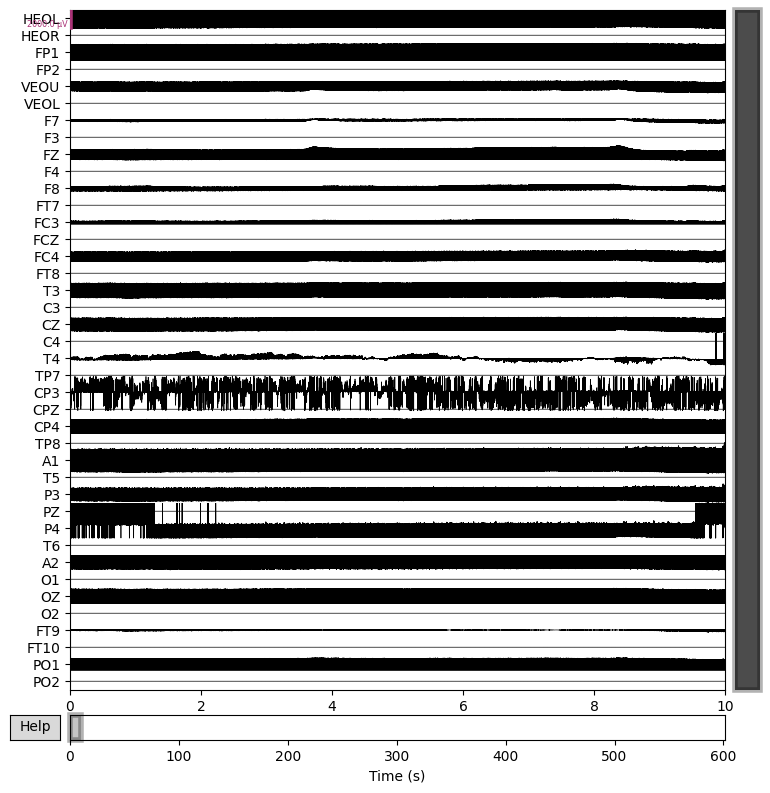

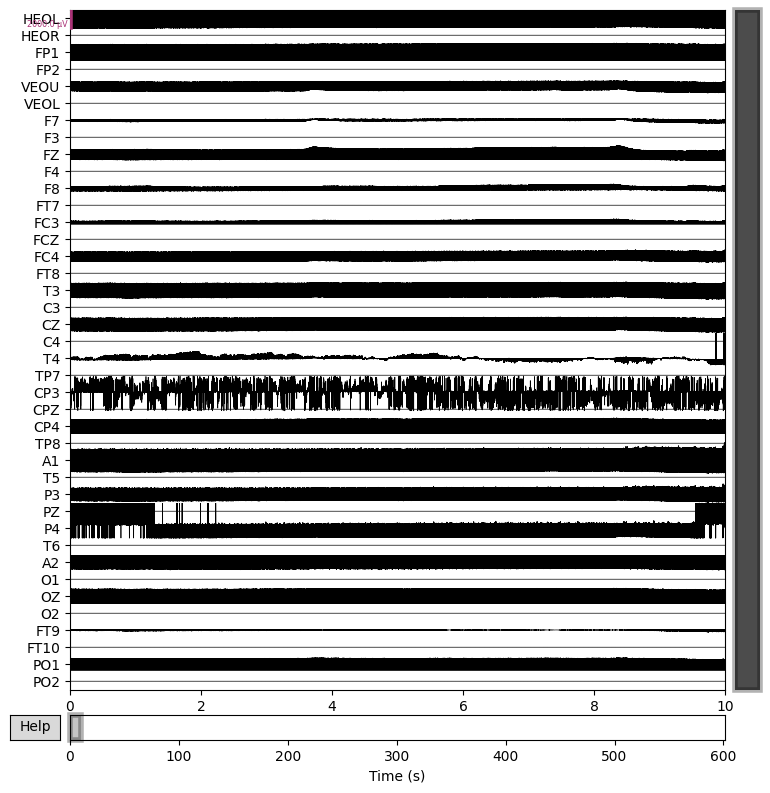

In [ ]:
scalings= {'eeg': 1e-3}
raw.plot(n_channels=40, scalings=scalings, title='EEG Data', block=True)

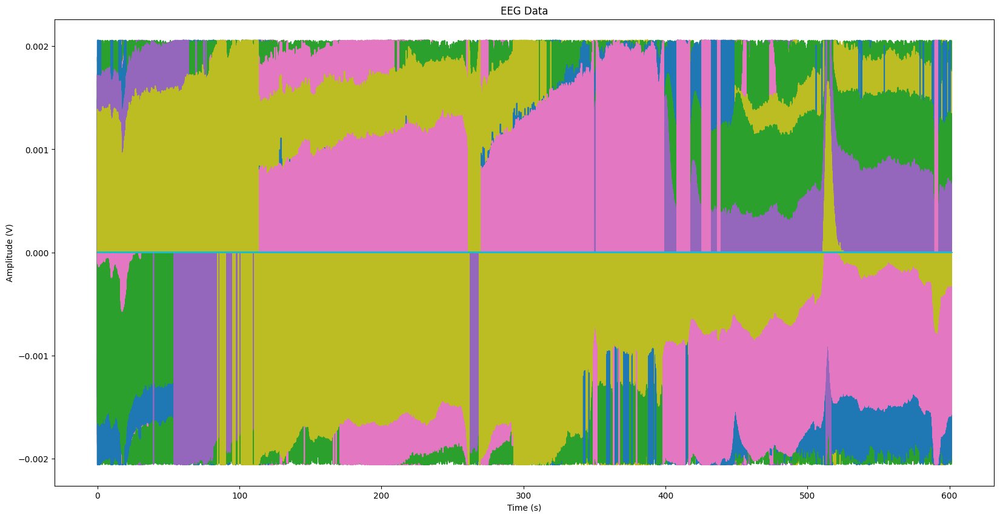

In [ ]:
data, times = raw[:]

# Create figure and axis objects
fig, ax = plt.subplots(figsize=(20,10))

# Plot EEG data with adjusted scalings
ax.plot(times, data.T * 100e-2)  # Adjust the scaling factor (100e-6) to your preference

# Set axis labels and title
ax.set_xlabel('Time (s)')
ax.set_ylabel('Amplitude (V)')
ax.set_title('EEG Data')

# Show plot
plt.show()


In [ ]:
f_channels = [ch_name for ch_name in raw.ch_names if ch_name.startswith('F')]

# Extract the data from the "F" channels
raw_f = raw.copy().pick_channels(f_channels)
eeg_data = raw_f.pick_types(eeg=True).get_data()
df = pd.DataFrame(eeg_data.T, columns=raw_f.ch_names)
df
# Plot the data from the "F" channels
# raw_f.plot(scalings=scalings, title='EEG Data')


,FP1,FP2,F7,F3,FZ,F4,F8,FT7,FC3,FCZ,FC4,FT8,FT9,FT10
0,0.000000,0.000000e+00,0.000937,3.137087e-07,-0.000092,1.254835e-07,0.001120,-1.003868e-06,0.000355,3.764504e-07,0.000641,4.391921e-07,-0.000066,3.764504e-07
1,0.001875,3.764504e-07,0.001142,4.391921e-07,-0.001287,3.764504e-07,0.000600,5.019339e-07,0.000000,0.000000e+00,0.001723,5.019339e-07,0.000000,0.000000e+00
2,0.000000,0.000000e+00,0.000936,3.137087e-07,-0.000096,1.254835e-07,0.001119,-1.003868e-06,0.000352,3.764504e-07,0.000639,4.391921e-07,-0.000067,3.764504e-07
3,0.001876,3.764504e-07,0.001142,4.391921e-07,-0.001288,3.764504e-07,0.000615,5.019339e-07,0.000000,0.000000e+00,0.001721,5.019339e-07,0.000000,0.000000e+00
4,0.000000,0.000000e+00,0.000939,3.137087e-07,-0.000094,1.254835e-07,0.001117,-1.003868e-06,0.000351,3.764504e-07,0.000640,4.391921e-07,-0.000062,3.764504e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
601435,0.000792,4.391921e-07,-0.000321,4.391921e-07,0.001014,4.391921e-07,-0.001241,5.019339e-07,0.000000,0.000000e+00,0.000531,5.646756e-07,0.000000,0.000000e+00
601436,0.000000,0.000000e+00,-0.000783,3.137087e-07,-0.001467,1.882252e-07,0.000089,-9.411260e-07,-0.001199,3.764504e-07,-0.000476,4.391921e-07,-0.001530,4.391921e-07
601437,0.000796,4.391921e-07,-0.000316,4.391921e-07,0.001019,4.391921e-07,-0.001237,5.019339e-07,0.000000,0.000000e+00,0.000544,5.646756e-07,0.000000,0.000000e+00
601438,0.000000,0.000000e+00,-0.000788,3.137087e-07,-0.001474,1.882252e-07,0.000087,-9.411260e-07,-0.001195,3.764504e-07,-0.000477,4.391921e-07,-0.001530,4.391921e-07


In [ ]:
# Preprocess
raw.filter(l_freq=1, h_freq=40)
# For example, to remove eye blinks using ICA
ica = mne.preprocessing.ICA(n_components=20, random_state=42)
ica.fit(raw)
ica.exclude = [0, 1]  # indices of ICs to exclude
# raw = ica.apply(raw)


raw.set_eeg_reference(ref_channels='average')
raw.set_eeg_reference(ref_channels='average', projection=True)

annotations = mne.Annotations(onset=[0, 4, 8], duration=[1, 1, 1], description=['Event 1', 'Event 2', 'Event 3'])
raw.set_annotations(annotations)

# Extract events from the annotations
events, event_id = mne.events_from_annotations(raw)
# raw.annotations
# print(event_id)

# stim_channel = 'HEOL'
# events = mne.find_events(raw,stim_channel=stim_channel)
# event_id = {'event_name': 1}
tmin, tmax = -0.2, 0.5
try:
    # events = mne.find_events(raw)
    epochs = mne.Epochs(raw, events, event_id, tmin=-0.2, tmax=0.5, baseline=None)
except ValueError as e:
    print("Error:", e)
print(events)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3301 samples (3.301 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Fitting ICA to data using 40 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    1.4s finished


Selecting by number: 20 components
Fitting ICA took 25.8s.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Used Annotations descriptions: ['Event 1', 'Event 2', 'Event 3']
Not setting metadata
3 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated
[[   0    0    1]
 [4000    0    2]
 [8000    0    3]]


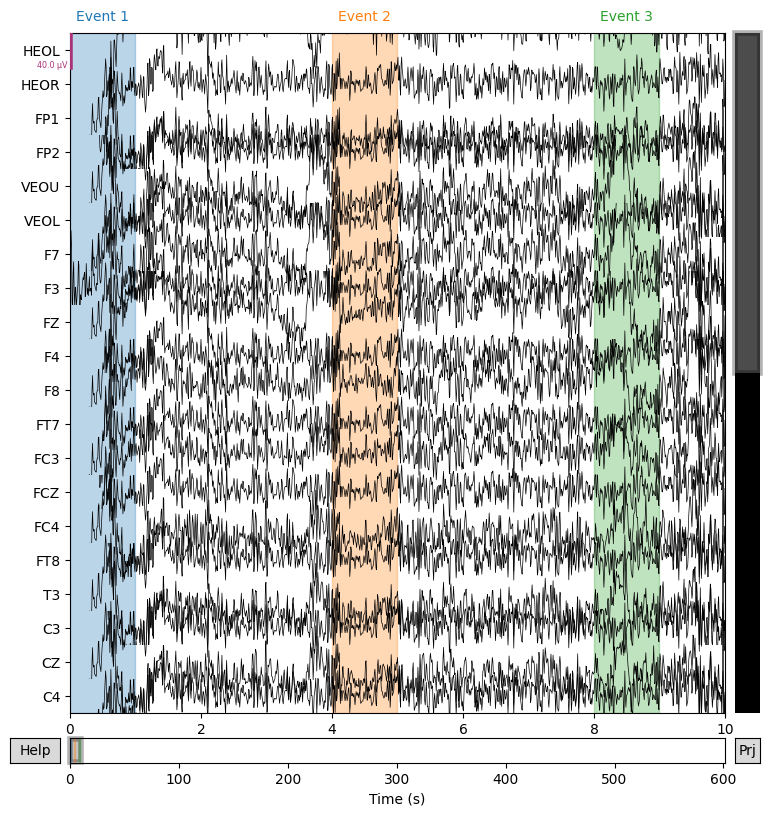

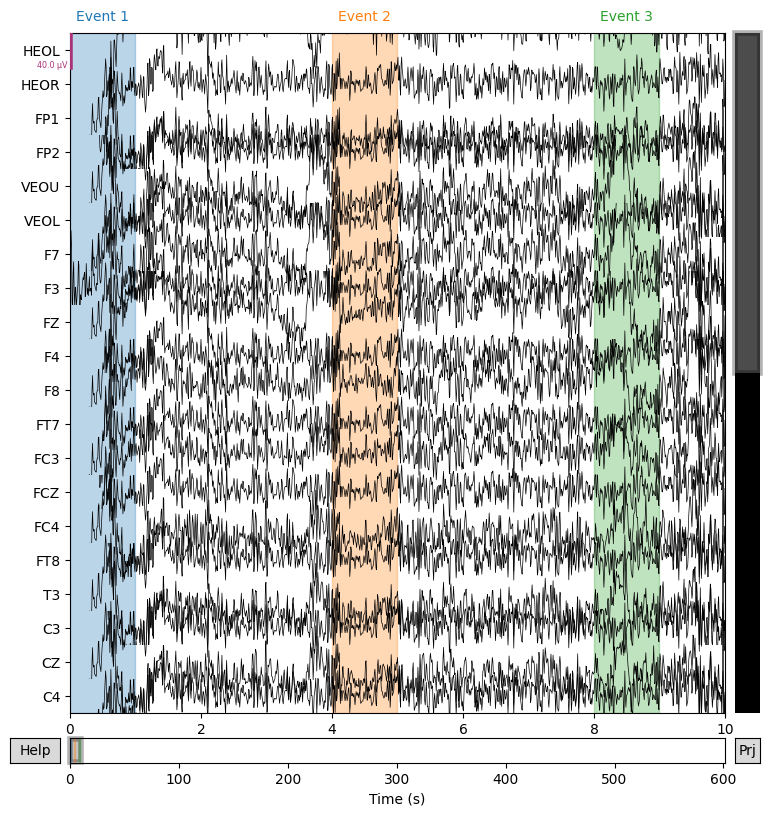

In [ ]:
mne.viz.plot_raw(raw)

In [ ]:
stim_channel = 'FP1'
events = mne.find_events(raw,stim_channel=stim_channel)
print(events)

[]


In [ ]:
print(sample_data[0])

<RawCNT | Fatigue state.cnt, 14 x 602400 (602.4 s), ~64.4 MB, data loaded>


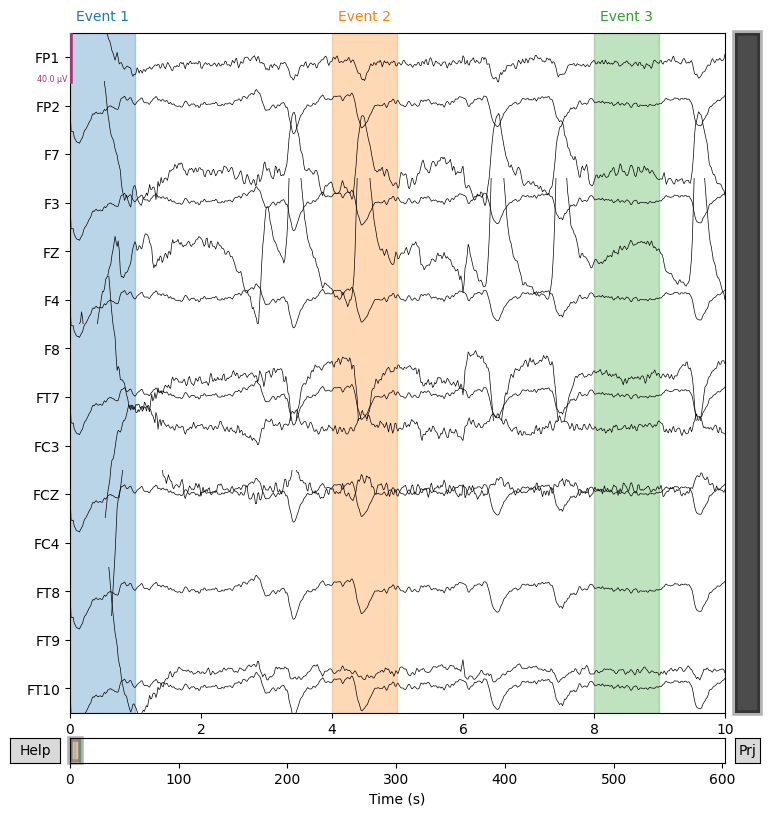

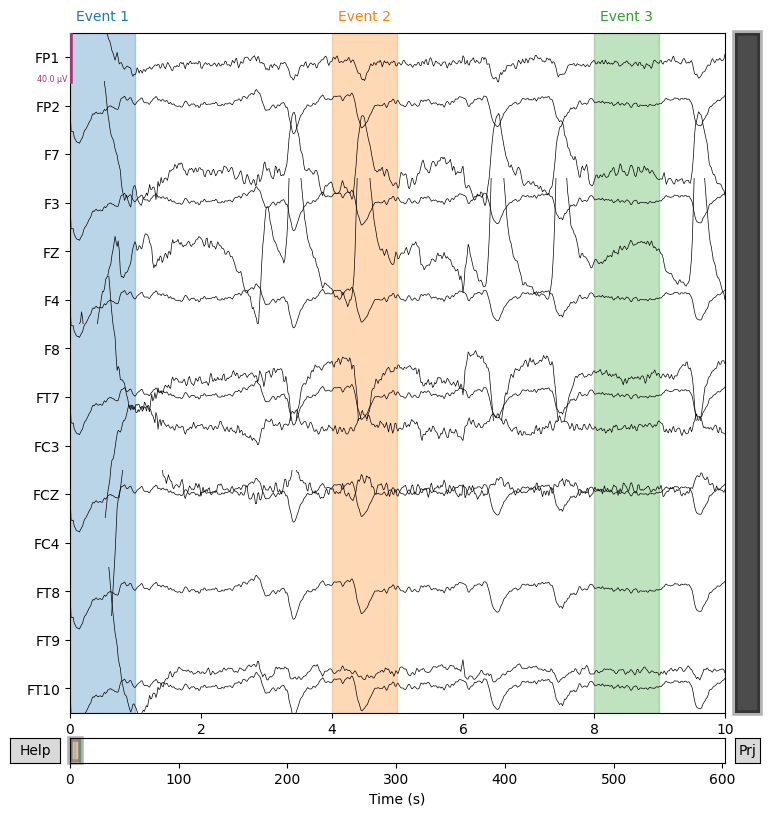

In [ ]:
mne.viz.plot_raw(sample_data[20])
# sample_data[1].plot()

In [ ]:
import numpy as np
def mean(x):
  arr = np.mean(x, axis=1)
  sum = 0;
  for i in range(0,len(arr)-1):
    sum = sum + arr[i]

  # print("sum:",sum, "avg", sum/len(arr))
  return sum/len(arr)
def median(x):
  arr = np.median(x, axis=1)
  sum = 0;
  for i in range(0,len(arr)-1):
    sum = sum + arr[i]

  # print("sum:",sum, "avg", sum/len(arr))
  return sum/len(arr)
def std(x):
  arr = np.std(x, axis=1)
  sum = 0;
  for i in range(0,len(arr)-1):
    sum = sum + arr[i]

  # print("sum:",sum, "avg", sum/len(arr))
  return sum/len(arr)
def var(x):
  arr = np.var(x, axis=1)
  sum = 0;
  for i in range(0,len(arr)-1):
    sum = sum + arr[i]

  # print("sum:",sum, "avg", sum/len(arr))
  return sum/len(arr)  
# def skewness(x):
#   return stats.skew(x)  
# def kurtosis(x):
#   return stats.kurtosis(x)
def compute_hjorth_mobility(data):
    """Hjorth mobility (per channel).
    Hjorth mobility parameter computed in the time domain.
    Parameters
    ----------
    data : ndarray, shape (n_channels, n_times)
    Returns
    -------
    output : ndarray, shape (n_channels,)
    Notes
    -----
    Alias of the feature function: **hjorth_mobility**. See [1]_.
    References
    ----------
    .. [1] Paivinen, N. et al. (2005). Epileptic seizure detection: A
           nonlinear viewpoint. Computer methods and programs in biomedicine,
           79(2), 151-159.
    """
    x = np.insert(data, 0, 0)
    dx = np.diff(x)
    sx = np.std(x, ddof=1)
    sdx = np.std(dx, ddof=1)
    mobility = np.divide(sdx, sx)
    return mobility
#Complexity
def compute_hjorth_complexity(data):
    """Hjorth complexity (per channel).
    Hjorth complexity parameter computed in the time domain.
    Parameters
    ----------
    data : ndarray, shape (n_channels, n_times)
    Returns
    -------
    output : ndarray, shape (n_channels,)
    Notes
    -----
    Alias of the feature function: **hjorth_complexity**. See [1]_.
    References
    ----------
    .. [1] Paivinen, N. et al. (2005). Epileptic seizure detection: A
           nonlinear viewpoint. Computer methods and programs in biomedicine,
           79(2), 151-159.
    """
    x = np.insert(data, 0, 0)
    dx = np.diff(x)
    m_dx = compute_hjorth_mobility(dx)
    m_x = compute_hjorth_mobility(data)
    complexity = np.divide(m_dx, m_x)
    return complexity
def shannon(x):
 y=np.power(x,2)  
 y1=np.sum(y)
 pe=y/y1
 se=np.sum(pe*np.log(np.power(pe,2)))
 return se
def logenergy(x):
  y=np.power(x,2)
  y1=np.sum(y)
  pe=y/y1
  lee=np.sum(pe*np.log(pe))
  return lee

def concatenate_features(x):
  return np.concatenate((mean(x),median(x),std(x),var(x)),axis=-1)


In [ ]:
def kurtosis(a):
    b = a # Extracting the data from the 14 channels
    output = np.zeros(len(b)) # Initializing the output array with zeros (length = 14)
    k = 0; # For counting the current row no.
    for i in b:
        mean_i = np.mean(i) # Saving the mean of array i
        std_i = np.std(i) # Saving the standard deviation of array i
        t = 0.0
        for j in i:
            t += (pow((j-mean_i)/std_i,4)-3)
        kurtosis_i = t/len(i) # Formula: (1/N)*(summation(x_i-mean)/standard_deviation)^4-3
        output[k] = kurtosis_i # Saving the kurtosis in the array created
        k +=1 # Updating the current row no.
    return np.sum(output)

In [ ]:
def skewness(arr):
    data = arr 
    skew_array = np.zeros(len(data)) #Initialinling the array as all 0s
    index = 0; #current cell position in the output array
   
    for i in data:
        skew_array[index]=sp.stats.skew(i,axis=0,bias=True)
        index+=1 #updating the cell position
    return np.sum(skew_array)/len(arr)

In [ ]:

# features=[]
# for d in sample_data:
#  data=d.get_data()
#  features.append(mean(data))
#  features.append(median(data))
#  features.append(var(data))
#  features.append(std(data))
#  features.append(kurtosis(data))
#  features.append(shannon(data))
#  features.append(logenergy(data))
#  features.append(compute_hjorth_mobility(data))
#  features.append(compute_hjorth_complexity(data))
# print(features)

In [ ]:
features1=[]
features2=[]
features3=[]
features4=[]
features5=[]
features6=[]
features7=[]
features8=[]
features9=[]
for d in sample_data:
 data=d.get_data()
 features1.append(mean(data))

for d in sample_data:
 data=d.get_data()
 features2.append(median(data))

for d in sample_data:
 data=d.get_data()
 features3.append(var(data))

for d in sample_data:
 data=d.get_data()
 features4.append(std(data))

# for d in sample_data:
#  data=d.get_data()
#  features5.append(kurtosis(data))

for d in sample_data:
 data=d.get_data()
 features6.append(shannon(data))

for d in sample_data:
 data=d.get_data()
 features7.append(logenergy(data))

for d in sample_data:
 data=d.get_data()
 features8.append(compute_hjorth_mobility(data))

for d in sample_data:
 data=d.get_data()
 features9.append(compute_hjorth_complexity(data))


fd=pd.DataFrame({"mean":features1,"median":features2,"var":features3,"standard deviation":features4,"shannon":features6,"log energy":features7,"hjorth_mobility":features8,"hjorth_complexity":features9})
# fd=pd.DataFrame({"mean":features1,"median":features2,"var":features3,"standard deviation":features4,"kurtosis":features5,"shannon":features6,"log energy":features7,"hjorth_mobility":features8,"hjorth_complexity":features9})
print(fd)

            mean        median           var  standard deviation    shannon  \
0   6.116681e-09  5.660584e-08  2.621234e-09            0.000038 -22.234119   
1  -3.915485e-09 -3.960236e-08  5.445073e-10            0.000015 -20.496529   
2  -9.985790e-09  4.180757e-08  1.094588e-09            0.000021 -19.838759   
3  -1.451759e-09  2.389752e-09  7.589070e-11            0.000007 -20.396355   
4   2.891028e-09 -2.871639e-07  1.121414e-08            0.000069 -24.975172   
5   4.688314e-09 -3.918007e-07  7.282183e-09            0.000063 -24.126108   
6  -4.065961e-09 -4.764700e-09  2.295239e-09            0.000032 -22.639603   
7   3.413247e-09 -3.809637e-08  2.917052e-09            0.000036 -21.945362   
8   2.171800e-09  1.973887e-08  2.014822e-09            0.000030 -21.937598   
9  -1.219916e-10  1.417529e-08  2.208321e-09            0.000032 -21.681087   
10 -2.523865e-09 -2.579570e-08  4.139898e-09            0.000046 -22.872338   
11 -2.281092e-10  6.227363e-09  9.804851e-11        

In [ ]:
fatigue_scale = ["F","N","F","N","F","N","F","N","F","N","F","N","F","N","F","N","F","N","F","N","F","N","F","N"]

In [ ]:
fatigue_array=[]
for i in fatigue_scale:
  if i=="N":
    fatigue_array.append("NORMAL")
  else:
    fatigue_array.append("FATIGUE")
print(fatigue_array)

['FATIGUE', 'NORMAL', 'FATIGUE', 'NORMAL', 'FATIGUE', 'NORMAL', 'FATIGUE', 'NORMAL', 'FATIGUE', 'NORMAL', 'FATIGUE', 'NORMAL', 'FATIGUE', 'NORMAL', 'FATIGUE', 'NORMAL', 'FATIGUE', 'NORMAL', 'FATIGUE', 'NORMAL', 'FATIGUE', 'NORMAL', 'FATIGUE', 'NORMAL']


In [ ]:
fd1=pd.DataFrame(columns=["Mean","Median","Variance","Standard Deviation","Shannon Entropy","Log Energy","Hjroth Mobility","Hjroth Complexity","Scale","Results"])

fd1["Mean"]=features1
fd1["Median"]=features2
fd1["Variance"]=features3
fd1["Standard Deviation"]=features4
# fd1["Kurtosis"]=features5
fd1["Shannon Entropy"]=features6
fd1["Log Energy"]=features7
fd1["Hjroth Mobility"]=features8
fd1["Hjroth Complexity"]=features9
# fd1["Theta"]=theta_array
# fd1["Beta"]=beta_array
fd1["Scale"]=fatigue_scale
# fd1["Ratio"]=ratio_array
fd1["Results"]=fatigue_array

In [ ]:
fd1

,Mean,Median,Variance,Standard Deviation,Shannon Entropy,Log Energy,Hjroth Mobility,Hjroth Complexity,Scale,Results
0,6.116681e-09,5.660584e-08,2.621234e-09,0.000038,-22.234119,-11.117060,0.044455,2.681345,F,FATIGUE
1,-3.915485e-09,-3.960236e-08,5.445073e-10,0.000015,-20.496529,-10.248265,0.063692,1.835061,N,NORMAL
2,-9.985790e-09,4.180757e-08,1.094588e-09,0.000021,-19.838759,-9.919380,0.045139,2.717694,F,FATIGUE
3,-1.451759e-09,2.389752e-09,7.589070e-11,0.000007,-20.396355,-10.198178,0.024715,14.124697,N,NORMAL
4,2.891028e-09,-2.871639e-07,1.121414e-08,0.000069,-24.975172,-12.487586,0.054700,1.954141,F,FATIGUE
5,4.688314e-09,-3.918007e-07,7.282183e-09,0.000063,-24.126108,-12.063054,0.052166,2.140021,N,NORMAL
6,-4.065961e-09,-4.764700e-09,2.295239e-09,0.000032,-22.639603,-11.319802,0.058173,1.910236,F,FATIGUE
7,3.413247e-09,-3.809637e-08,2.917052e-09,0.000036,-21.945362,-10.972681,0.064246,1.589167,N,NORMAL
8,2.171800e-09,1.973887e-08,2.014822e-09,0.000030,-21.937598,-10.968799,0.059341,1.937324,F,FATIGUE
9,-1.219916e-10,1.417529e-08,2.208321e-09,0.000032,-21.681087,-10.840543,0.045979,2.436008,N,NORMAL


In [ ]:
# pd.concat([fd1.drop('Mean', axis=1), pd.DataFrame(fd1['Mean'].tolist())], axis=1)
fd1["Mean"][1]

-3.915484587475716e-09

In [ ]:
x = fd1.iloc[:, [0,7]].values
y = fd1.iloc[:,9].values
x[20][0]

3.5990387409903844e-09

In [ ]:
#Logistic Regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3)
classifier = LogisticRegression(random_state = 0)
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)
# print (xtrain[0:10, :])
print ("Accuracy : ", accuracy_score(y_test, y_pred))
scores = cross_val_score(classifier, x, y, cv=4)
print("Accuracy for each fold: ", scores)
print("Average accuracy:", np.mean(scores)*100,"%")

Accuracy :  0.5
Accuracy for each fold:  [0.66666667 0.66666667 0.16666667 0.66666667]
Average accuracy: 54.166666666666664 %


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3)
classifier = SVC(kernel='linear', random_state=0)
classifier.fit(x_train, y_train)
y_pred = classifier.predict(x_test)

print("Accuracy: ", accuracy_score(y_test, y_pred))
scores = cross_val_score(classifier, x, y, cv=4)
print("Accuracy for each fold: ", scores)
print("Average accuracy:", np.mean(scores)*100,"%")


Accuracy:  0.375
Accuracy for each fold:  [0.66666667 0.66666667 0.33333333 0.66666667]
Average accuracy: 58.33333333333333 %


In [ ]:
#Random Forest
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.35)
clf = RandomForestClassifier(n_estimators = 100) 
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
from sklearn import metrics  
print()
# print("ACCURACY OF THE MODEL: ", metrics.accuracy_score(y_test, y_pred))
scores = cross_val_score(clf, x, y, cv=4)
print("Accuracy for each fold: ", scores)
print("Average accuracy:", np.mean(scores)*100,"%")


Accuracy for each fold:  [0.16666667 0.5        0.16666667 0.83333333]
Average accuracy: 41.666666666666664 %


Accuracy for each fold:  [0.2 0.6 0.4 0.4 1. ]
Average accuracy: 52.0 %


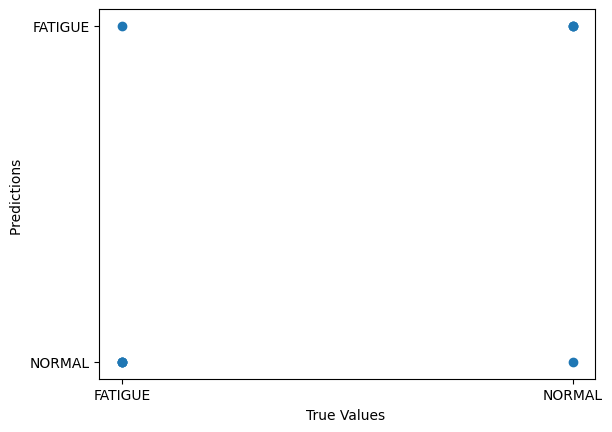

In [ ]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.35)
dtc=DecisionTreeClassifier()
dtc=dtc.fit(x_train,y_train)
result=dtc.predict(x_test)
# dtc.score(x_test,y_test)
acc = accuracy_score(y_test,result)
acc
scores = cross_val_score(dtc, x, y, cv=5)
print("Accuracy for each fold: ", scores)
print("Average accuracy:", np.mean(scores)*100,"%")
predictResult=dtc.predict(x_test)
predictResult
plt.scatter(y_test,predictResult)
plt.xlabel('True Values ')
plt.ylabel('Predictions ')
plt.show()